(20631, 26)
(185, 23)
[[2.73100853e-04 0.00000000e+00 0.00000000e+00 5.00850001e-01
  5.70216721e+00 8.80836918e+00 0.00000000e+00 1.03411494e-03
  8.84733015e-01 7.24960189e-02 3.93284084e+00 0.00000000e+00
  2.72992293e-01 7.60353568e-01 7.04389659e-02 4.15269634e+00
  3.77476557e-02 0.00000000e+00 1.47235544e+00 0.00000000e+00
  0.00000000e+00 1.67349151e-01 1.06117440e-01]]


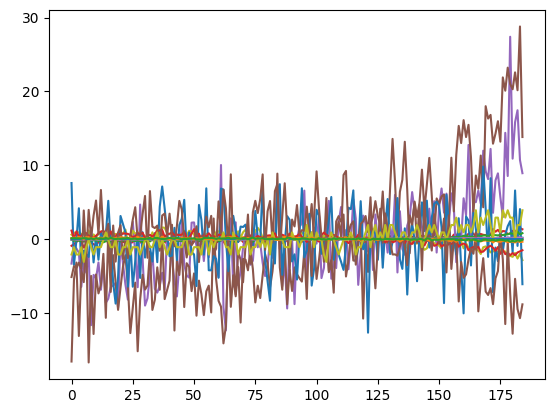

In [1]:
# Load data
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

data = np.loadtxt("train_FD001.txt") # DOWNLOAD THE DATA FROM THE LINK IN THE PAPER
print(data.shape)

xs = []
starting_points = np.where(data[:, 1] == 1.0)[0]
for i in range(0, len(starting_points) - 1):
    x = data[
        starting_points[i]:starting_points[i+1],
        3:
    ]

    x -= np.mean(x, axis=0, keepdims=True)
    # x = (x / np.std(x, axis=0, keepdims=True))[:, np.std(x, axis=0) > 0]

    x = x[:, np.all(np.isfinite(x), axis=0)]

    xs.append(x)

print(x.shape)
plt.plot(x)
print(np.std(x, axis=0, keepdims=True))

In [2]:
from rhythmic_sharing import RhythmicNetwork

from tqdm import tqdm
import numpy as np

best_mse = np.inf

for sr in tqdm(np.linspace(0.2, 0.8, 10)):
    for iw in np.linspace(0.25, 1.0, 10):
        for l in np.linspace(0.5, 0.95, 10):
            network = RhythmicNetwork(
                # Tune Rhythmic Sharing
                dt=10,
                input_dims=x.shape[1],
                spectral_radius=sr,
                input_weight=iw,
                average_degree_nodes=8,
                num_nodes=512, # 256
                leakage=l,
                # Rhythmic params
                link_strength_change_ratio=0
            )

            network.train(x.T[:, :-100])
            pred = network.predict(x.T[:, -110:], warmup_time=10)
            mse = np.mean(np.square((pred[:, 1:] - x.T[:, -100:]))) # /np.std(pred[:, 1:], axis=1, keepdims=True)))
            if mse > 100_000_000:
                network.lsqrs = not network.lsqrs
            
            if mse < best_mse:
                print("New best %.10f" % mse, (sr, iw, l))
                best_esn_param = (sr, iw, l)
                best_mse = mse

  0%|                                                                                           | 0/10 [00:01<?, ?it/s]


KeyboardInterrupt: 

 30%|████████████████████████▌                                                         | 3/10 [19:17<44:29, 381.41s/it]

New best 0.0044268974 (np.float64(0.25), np.float64(0.016666666666666663), np.float64(0.37777777777777777), np.float64(0.01))


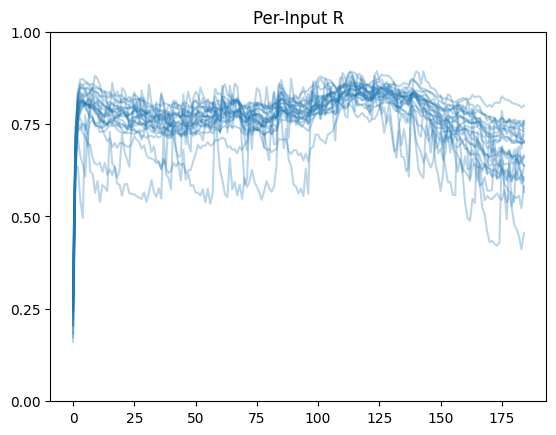

 40%|████████████████████████████████▊                                                 | 4/10 [26:04<39:10, 391.71s/it]

New best 0.0120603460 (np.float64(0.25), np.float64(0.005555555555555557), np.float64(0.37777777777777777), np.float64(0.01))


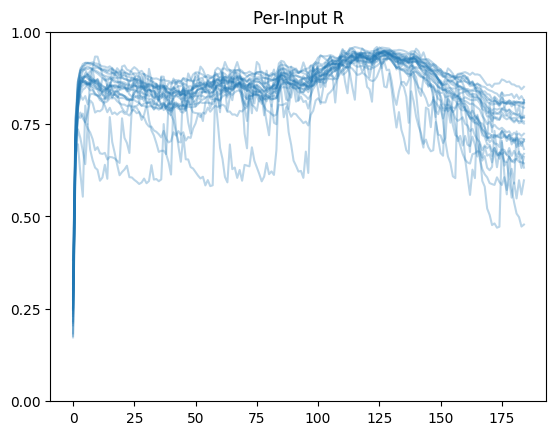

 70%|█████████████████████████████████████████████████████████▍                        | 7/10 [42:52<17:24, 348.01s/it]

New best 0.0169532765 (np.float64(0.25), np.float64(-0.02777777777777778), np.float64(0.45555555555555555), np.float64(0.01))


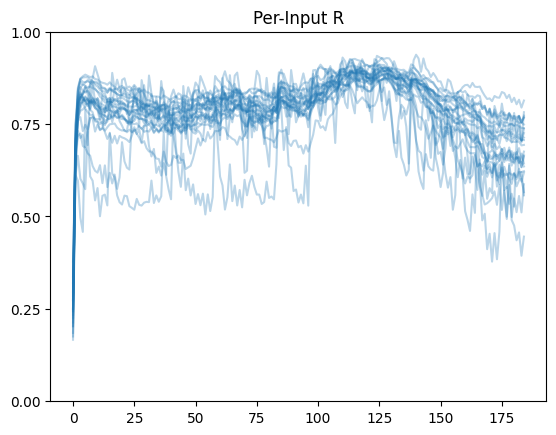

 80%|█████████████████████████████████████████████████████████████████▌                | 8/10 [48:13<11:18, 339.30s/it]

New best 0.0207178961 (np.float64(0.25), np.float64(-0.03888888888888889), np.float64(0.45555555555555555), np.float64(0.01))


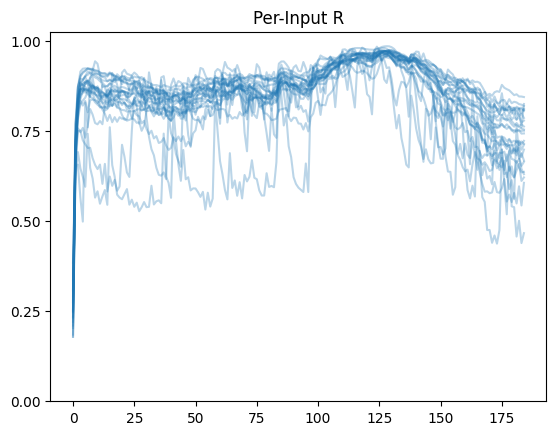

 90%|█████████████████████████████████████████████████████████████████████████▊        | 9/10 [52:28<05:49, 349.82s/it]


KeyboardInterrupt: 

In [3]:
best_difference = 0
for lsr in np.linspace(0.25, 1, 10):
    for e1 in tqdm(np.linspace(-0.05, 0.05, 10)[::-1]): # tqdm(np.linspace(-0.1, -0.0, 10)[::-1]):
        for o in np.linspace(0.01, 0.4, 10):
            for e2 in np.linspace(0.3, 1.0, 10):
                network = RhythmicNetwork(
                    # Tune Rhythmic Sharing
                    dt=10,
                    input_dims=x.shape[1],
                    spectral_radius=best_esn_param[0],
                    input_weight=best_esn_param[1],
                    average_degree_nodes=8,
                    num_nodes=512, #256,
                    leakage=best_esn_param[2],
                    # Rhythmic params
                    link_strength_change_ratio=lsr,
                    omega0=o,
                    epsilon1=e1,
                    epsilon2=e2,
                )

                network.train(x.T, warmup_time=0)
                r = network.get_global_parameters()[0]
                sixty_per = int(len(r) * 0.6)
    
                diff = np.std(r[sixty_per:]) - np.std(r[:sixty_per]) #/np.mean(r.T[:250])
                
                if diff > best_difference and np.mean(r.T[:sixty_per]) > 0.5: # np.mean(network.get_input_parameters()[0].T[75:100, 11]) > 0.5: # and np.mean(network.get_input_parameters()[0].T[75:100, 15]) > 0.5:
                    print("New best %.10f" % diff, (lsr, e1, e2, o))
                    best_param_rhy = (lsr, e1, e2, o)
                    best_difference = diff
    
                    plt.title("Per-Input R")
                    plt.plot(network.get_input_parameters()[0].T, color="tab:blue", alpha=0.3)
                    plt.yticks([0, 0.25, 0.5, 0.75, 1])
                    plt.show()

In [3]:
best_esn_param = (0.8, 0.83, 0.65) # best_esn_param = (0.8, 0.75, 0.5) # best_esn_param = (0.8, 1, 0.5)
best_param_rhy = (0.25, -0.04, 0.46, 0.01) # best_param_rhy = (0.75, -0.18, 0.76, 0.31)

In [4]:
# Run all datasets through detector

global_rs = []
input_rs = []
num_chan = x.shape[1]

for x in tqdm(xs):
    network = RhythmicNetwork(
        # Tune Rhythmic Sharing
        dt=10,
        input_dims=x.shape[1],
        spectral_radius=best_esn_param[0],
        input_weight=best_esn_param[1],
        average_degree_nodes=8,
        num_nodes=512,
        leakage=best_esn_param[2],
        # Rhythmic params
        link_strength_change_ratio=best_param_rhy[0],
        omega0=best_param_rhy[3],
        epsilon1=best_param_rhy[1],
        epsilon2=best_param_rhy[2],
    )
    
    network.train(x.T, warmup_time=0)
    global_rs.append(network.get_global_parameters()[0])
    input_rs.append(network.get_input_parameters()[0])

print(len(xs), len(input_rs))

100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [09:57<00:00,  6.04s/it]

99 99


In [5]:
from drift_helpers.mmdagg import mmdagg

# MMDAgg-based Drift Detector (pseudocode)
# Works like river: you call update(x_t) per timestep.

class MMDAggDriftDetector:
    def __init__(self, window_size=32, step_size=1, alpha=0.001):
        self.reference_buffer = []
        self.test_buffer = []
        self.window_size = window_size
        self.step_size = step_size
        self.alpha = alpha
        self.drift_detected = False
        self.num_samples_seen = 0

    def update(self, x_t):
        """
        x_t : np.ndarray (shape = [n_channels]) or list
        """
        self.num_samples_seen += 1
        self.test_buffer.append(x_t)

        # When test window full, run drift test
        if len(self.test_buffer) >= self.window_size:
            if len(self.reference_buffer) >= self.window_size:

                # Run MMDAgg two-sample test
                self.drift_detected = mmdagg(np.asarray(self.reference_buffer), np.asarray(self.test_buffer), alpha=self.alpha) == 1
                if self.drift_detected:
                    self._on_drift()
                    
            # Slide windows
            self.reference_buffer = (
                self.reference_buffer[-self.window_size:] + self.test_buffer[:self.step_size]
            )
            self.test_buffer = self.test_buffer[self.step_size:]

        return self.drift_detected

    def _on_drift(self):
        # Reset reference window to post-drift data (optional)
        self.reference_buffer = self.test_buffer.copy()
        self.test_buffer = []
        # Optionally log or emit signal
        # print(f"Drift detected at t={self.num_samples_seen}")

0it [00:00, ?it/s]

0.00075


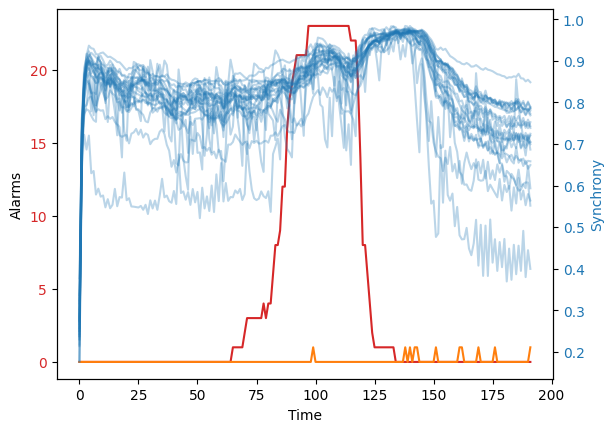

1it [00:04,  4.57s/it]

[ 0.  0.  0.  3.  7.  7.  8.  8. 10. 11. 11. 11. 13. 13. 13. 13. 14. 14.
 15. 16. 17. 22. 22.]
0.00075


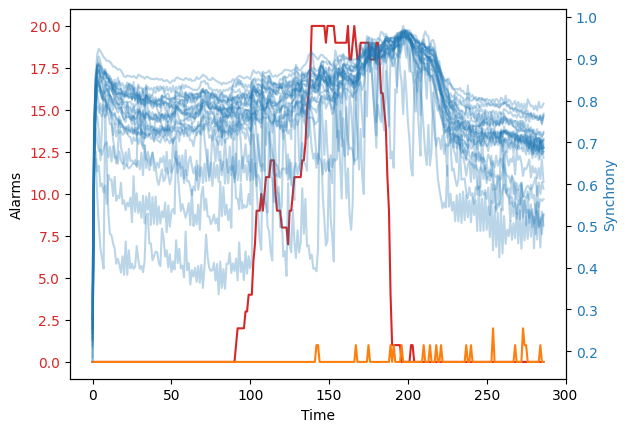

2it [00:11,  6.11s/it]

[16. 17. 22. 24. 27. 27. 28. 29. 29. 32. 35. 38. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


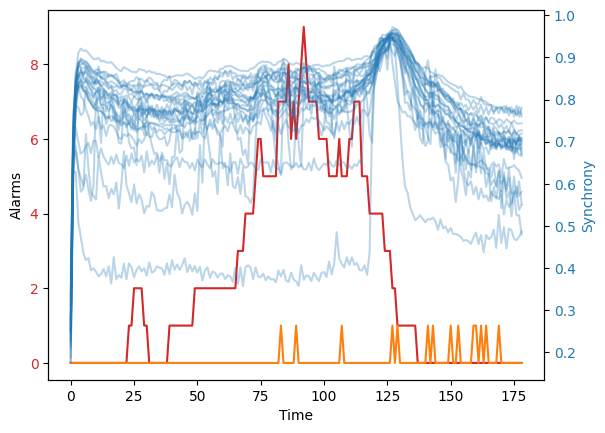

3it [00:15,  5.01s/it]

[ 0.  0.  0.  0.  0.  0.  7. 11. 17. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


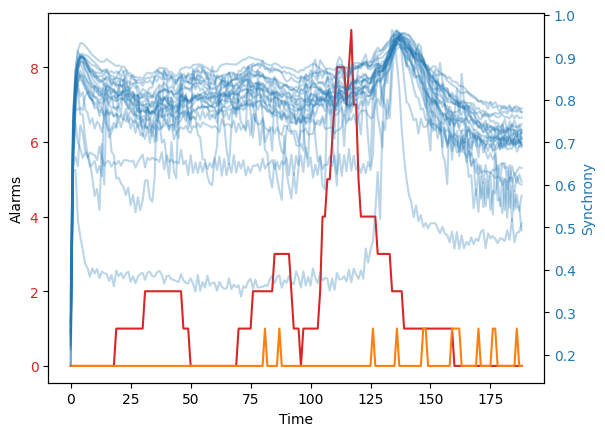

4it [00:19,  4.73s/it]

[ 0.  1. 10. 30. 32. 34. 35. 36. 42. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


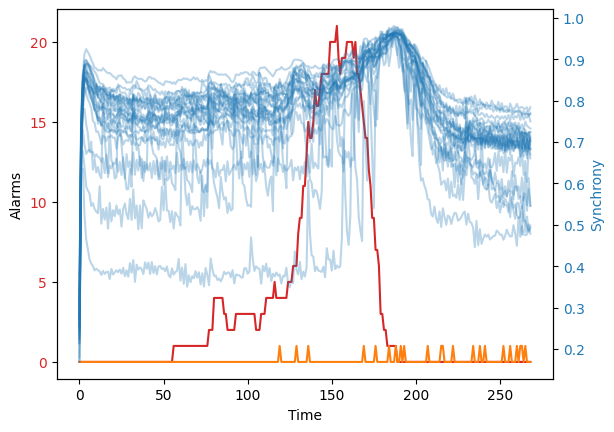

5it [00:26,  5.32s/it]

[ 0.  2.  5.  5. 41. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


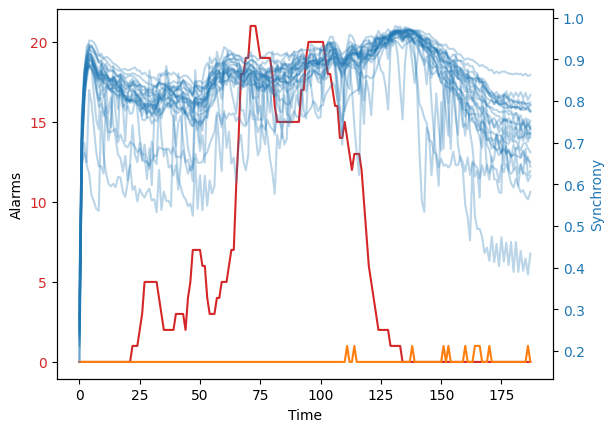

6it [00:30,  4.91s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0. 20. nan nan nan]
0.00075


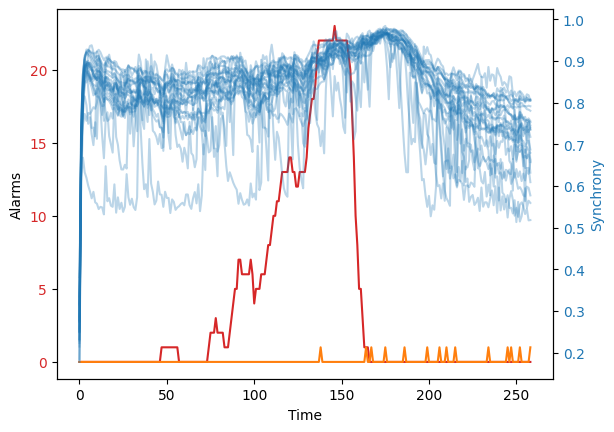

7it [00:36,  5.28s/it]

[ 0.  0.  3. 13. 14. 16. 16. 33. 35. 36. 38. 40. 41. 45. nan nan nan nan
 nan nan nan nan nan]
0.00075


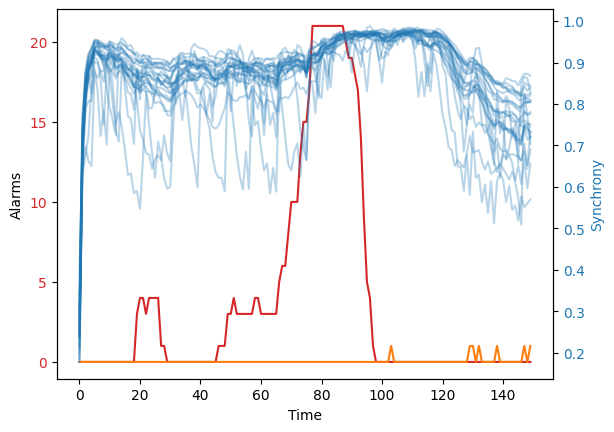

8it [00:39,  4.54s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  2.
  2.  2.  2. nan nan]
0.00075


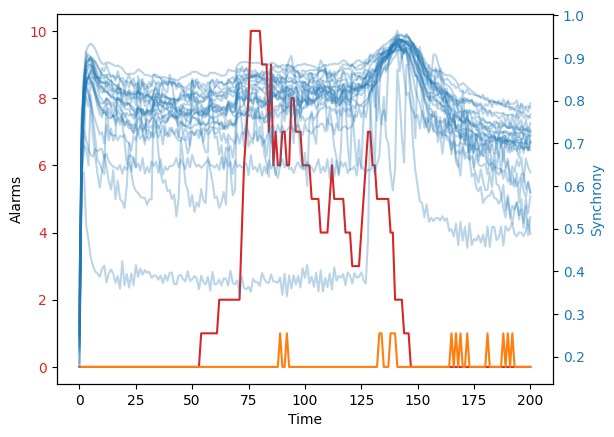

9it [00:43,  4.50s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  1.  1. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


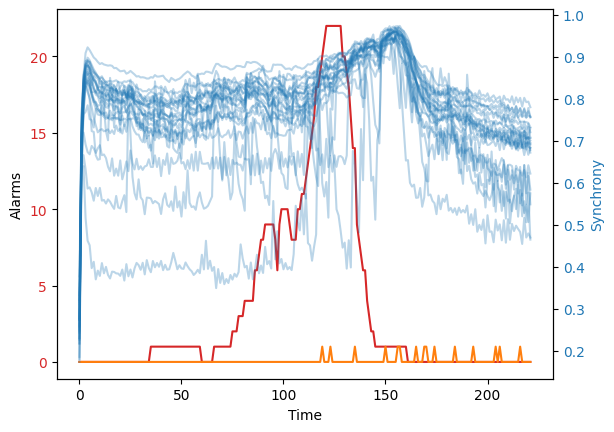

10it [00:48,  4.59s/it]

[ 0.  0.  3.  6. 11. 11. 13. 14. 16. 24. 34. 36. 37. 38. 39. 40. 41. 41.
 43. 44. 45. 46. nan]
0.00075


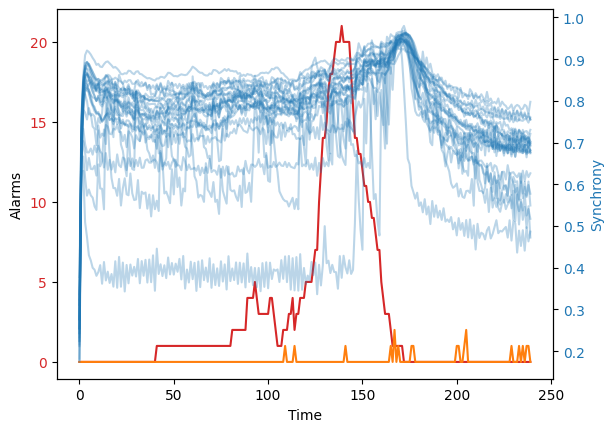

11it [00:53,  4.85s/it]

[ 0.  6. 14. 14. 18. 49. nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


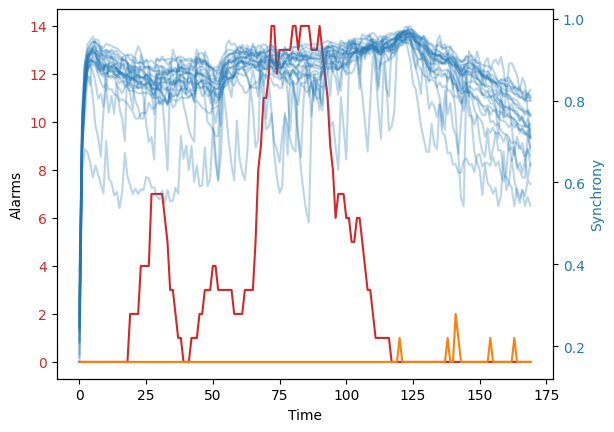

12it [00:57,  4.41s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  5. nan nan nan nan
 nan nan nan nan nan]
0.00075


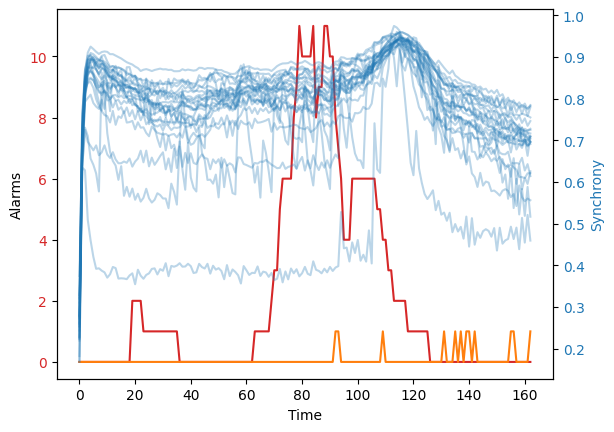

13it [01:00,  4.06s/it]

[ 0.  0.  0.  0.  0.  0.  2.  2.  3.  4.  4. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


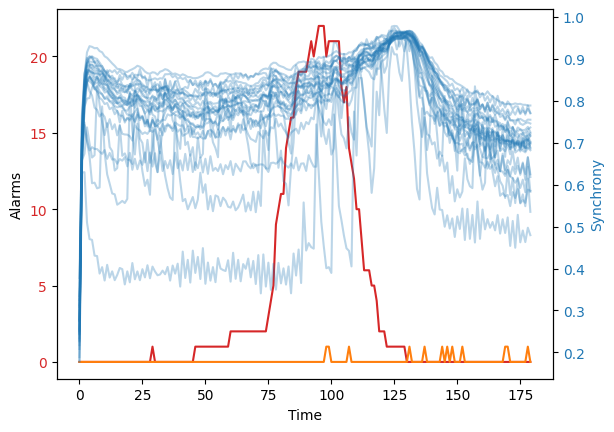

14it [01:04,  4.06s/it]

[ 0.  0.  0.  1.  2.  3.  3.  3.  3.  4.  5.  7.  7.  7.  8.  9. 11. 11.
 12. 16. 17. 20. nan]
0.00075


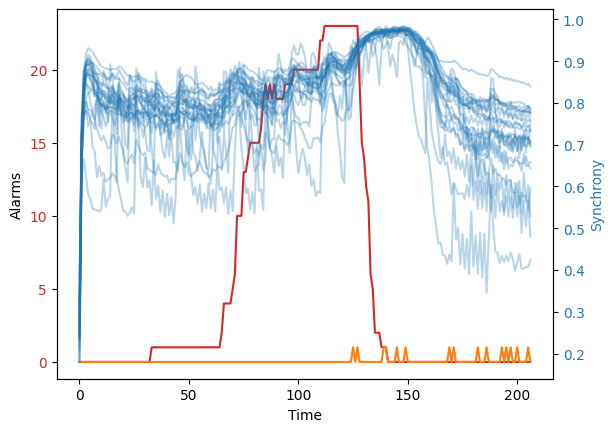

15it [01:09,  4.20s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  3.  8.  9.  9.
 10. 23. 35. 35. 37.]
0.00075


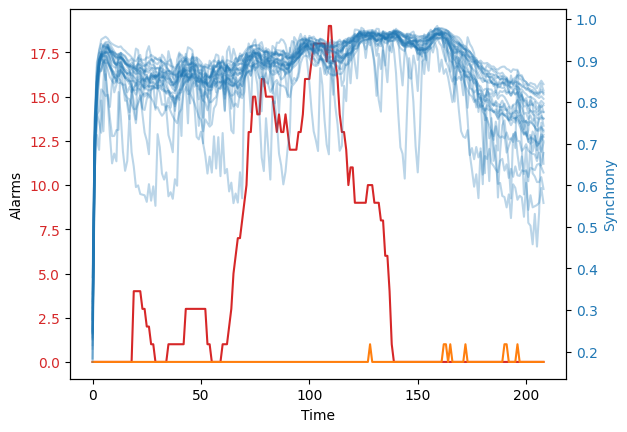

16it [01:13,  4.32s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3. 26. 27.
 34. nan nan nan nan]
0.00075


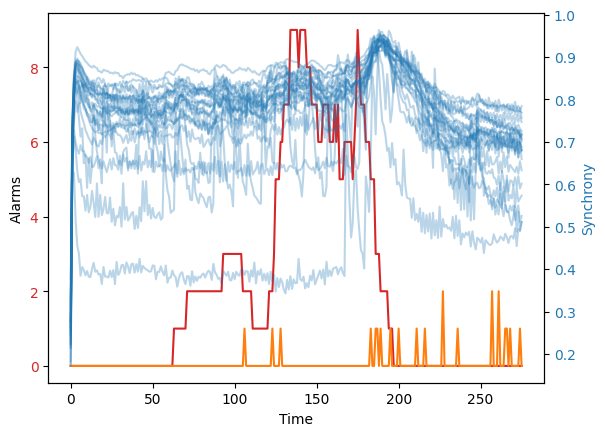

17it [01:20,  5.04s/it]

[ 0.  0. 18. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


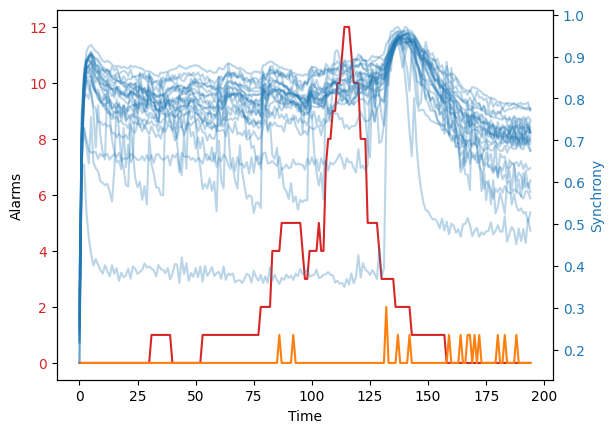

18it [01:24,  4.82s/it]

[ 0.  3.  8.  8. 12. 31. 31. 32. 34. 36. 38. 39. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


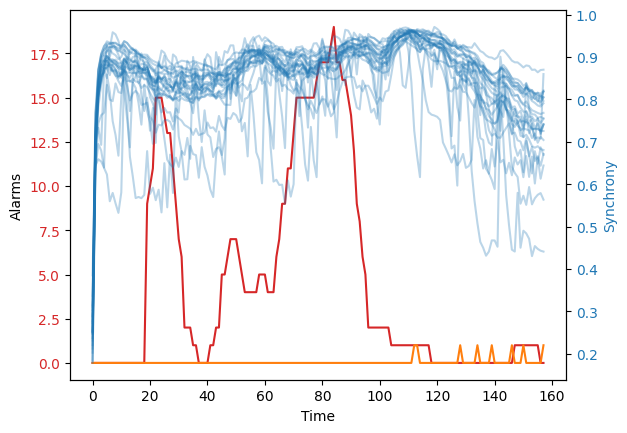

19it [01:27,  4.31s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  4.  8.
  9. nan nan nan nan]
0.00075


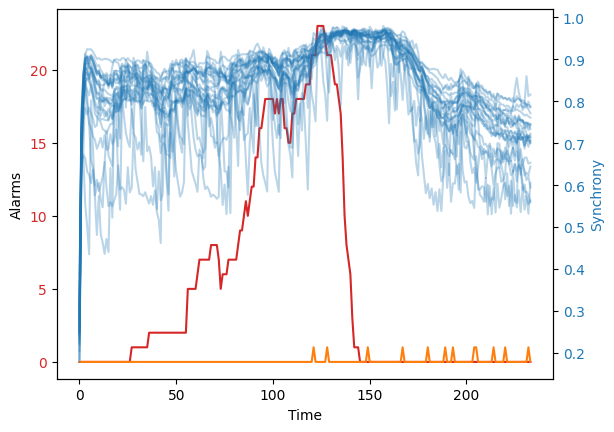

20it [01:33,  4.60s/it]

[ 0.  0.  0.  0.  0.  0.  2.  7.  8. 10. 11. 14. 16. 16. 18. 18. 20. 21.
 42. 45. 45. 48. 48.]
0.00075


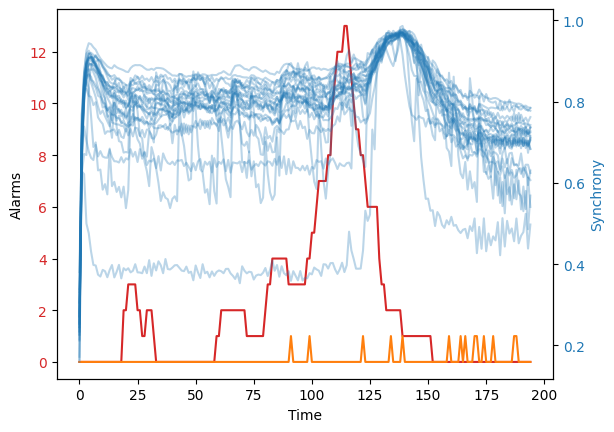

21it [01:37,  4.53s/it]

[ 0.  5.  6.  8. 25. 27. 28. 32. 34. 34. 35. 36. 39. nan nan nan nan nan
 nan nan nan nan nan]
0.00075


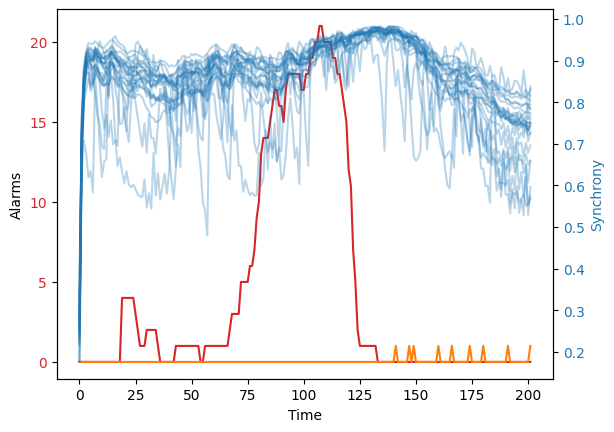

22it [01:41,  4.51s/it]

[ 0.  0.  0.  0.  0.  1.  3.  4.  4.  5.  6.  6.  6.  7. 10. 11. 12. 18.
 28. 30. 32. nan nan]
0.00075


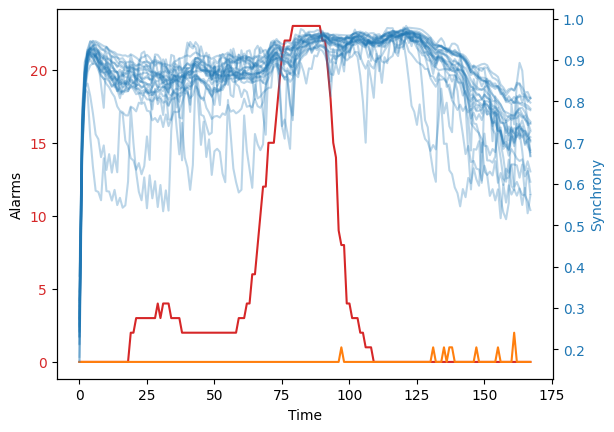

23it [01:45,  4.15s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 4.]
0.00075


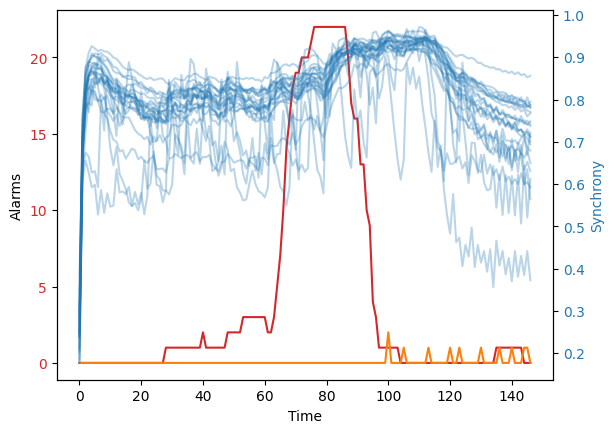

24it [01:48,  3.76s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  1. nan]
0.00075


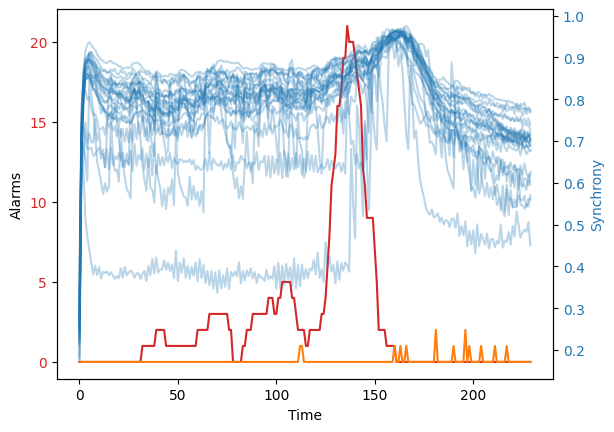

25it [01:53,  4.29s/it]

[ 0.  0.  0. 21. 28. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


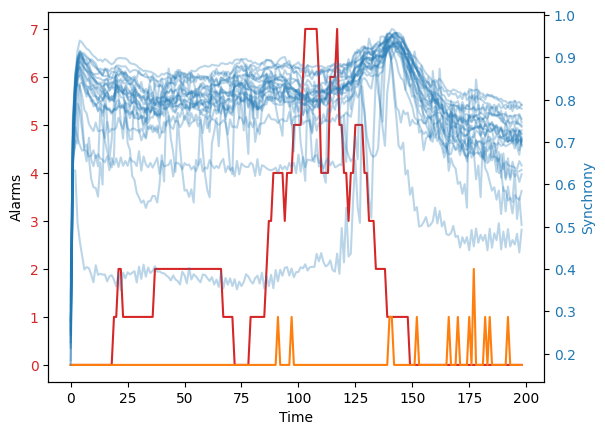

26it [01:58,  4.43s/it]

[ 4. 11. 12. 14. 23. 27. 28. nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


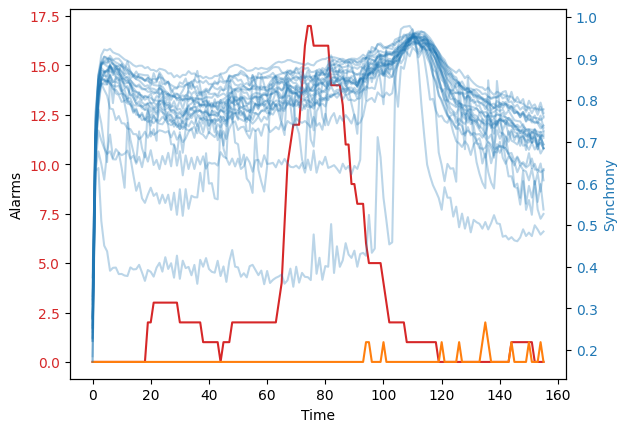

27it [02:01,  4.11s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan
 nan nan nan nan nan]
0.00075


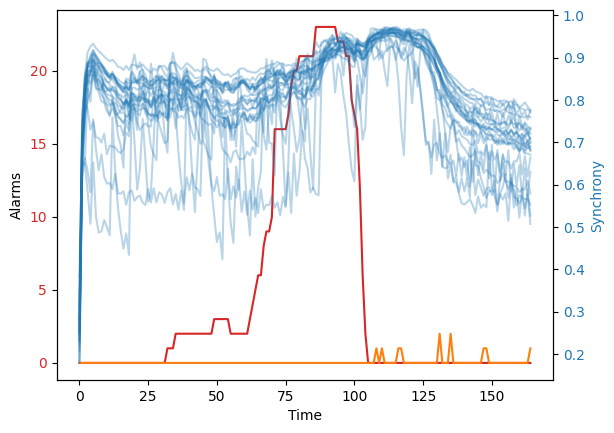

28it [02:05,  3.94s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  2.
  2.  3.  5. 11. 11.]
0.00075


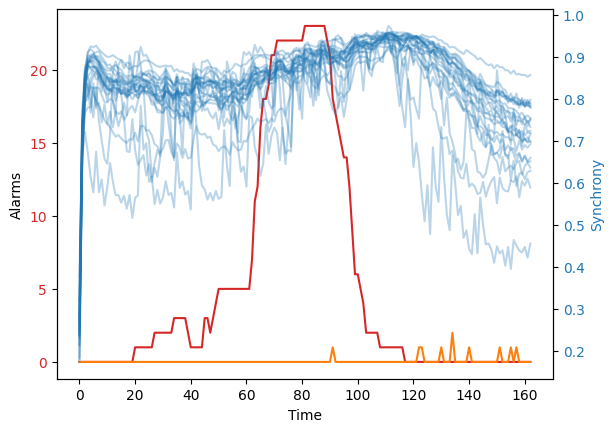

29it [02:09,  3.87s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 6.]
0.00075


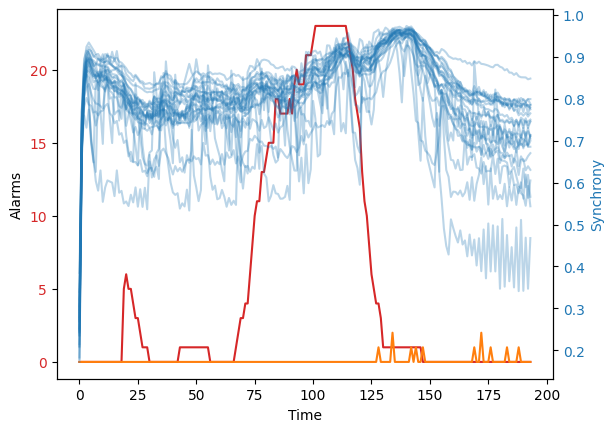

30it [02:13,  3.99s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  3.  3.  5.  6.  9.  9.  9.
 17. 18. 22. 25. 26.]
0.00075


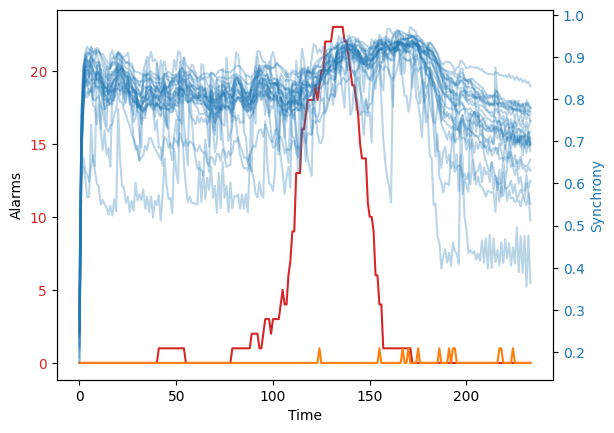

31it [02:18,  4.34s/it]

[ 4. 14. 21. 29. 30. 33. 34. 35. 35. 37. 37. 37. 37. 40. 40. 40. 42. 43.
 47. nan nan nan nan]
0.00075


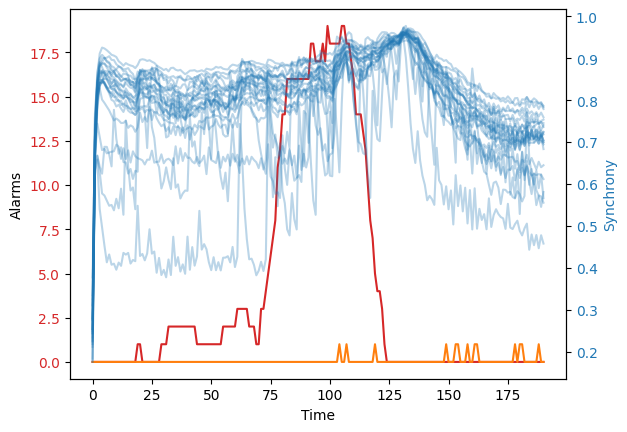

32it [02:22,  4.36s/it]

[ 0.  0.  0.  0.  0.  0.  1.  2.  3.  3.  3.  4.  5.  5.  7.  7. 17. 17.
 24. nan nan nan nan]
0.00075


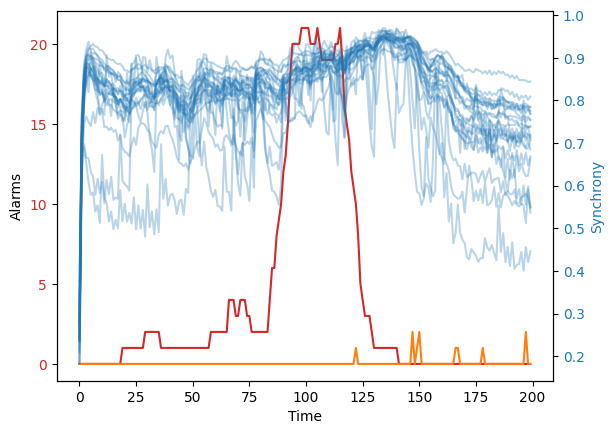

33it [02:27,  4.39s/it]

[ 0.  0.  0.  9. 10. 10. 12. 12. 13. 14. 15. 15. 16. 17. 17. 18. 18. 18.
 19. 19. 23. nan nan]
0.00075


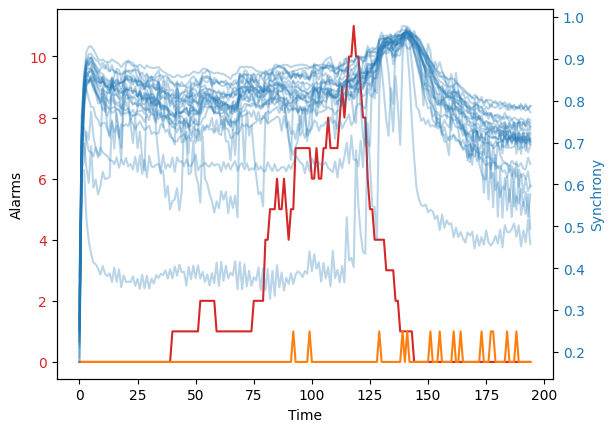

34it [02:32,  4.50s/it]

[ 0.  0.  5.  5.  7. 10. 18. 32. 38. 41. 43. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


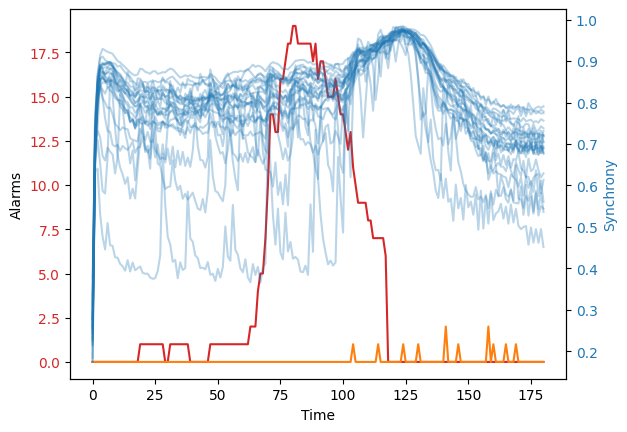

35it [02:36,  4.36s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  3.
  5. nan nan nan nan]
0.00075


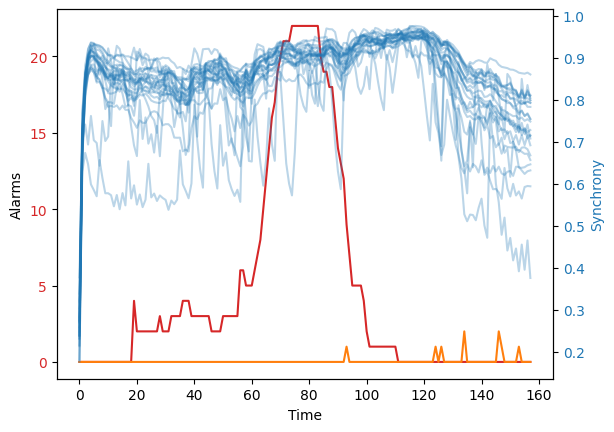

36it [02:39,  4.13s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0. nan]
0.00075


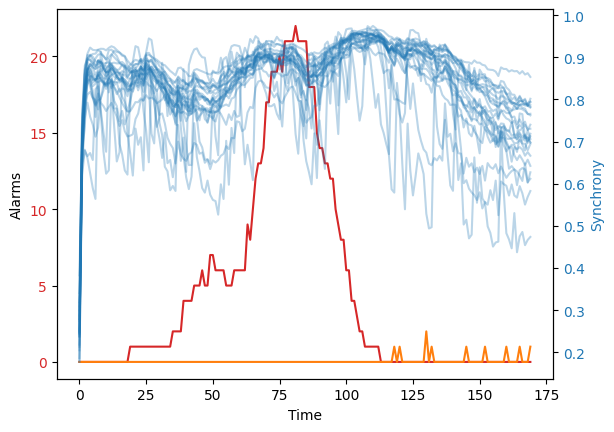

37it [02:43,  4.09s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  2.  6. nan]
0.00075


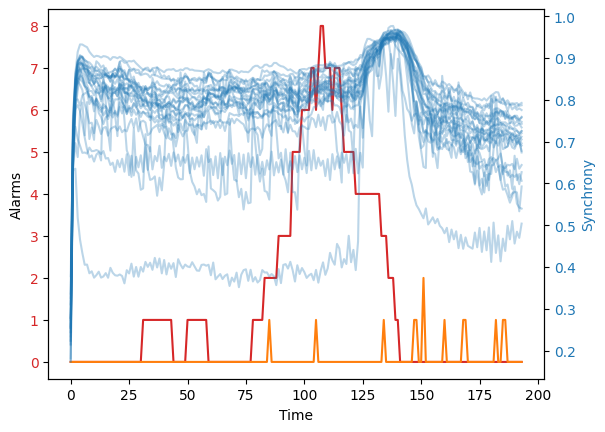

38it [02:48,  4.18s/it]

[ 3.  8. 14. 20. 20. 24. 28. 32. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


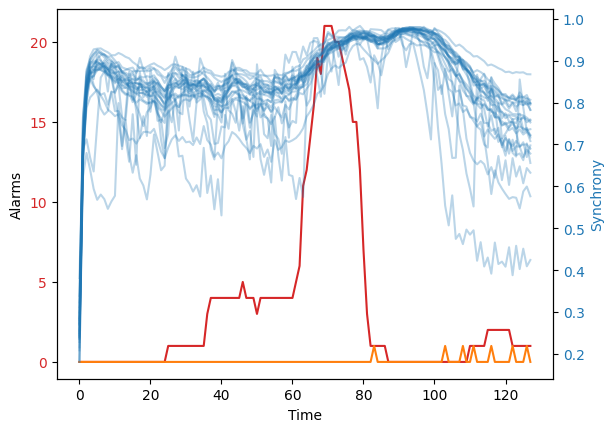

39it [02:50,  3.60s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 nan nan nan nan nan]
0.00075


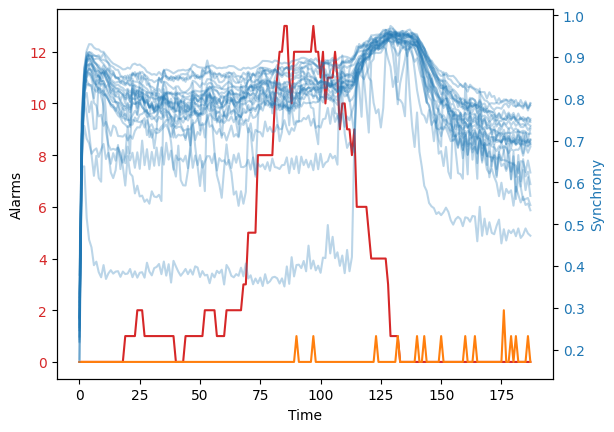

40it [02:54,  3.82s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  6.  6.  7.  8. 10. nan nan nan nan nan
 nan nan nan nan nan]
0.00075


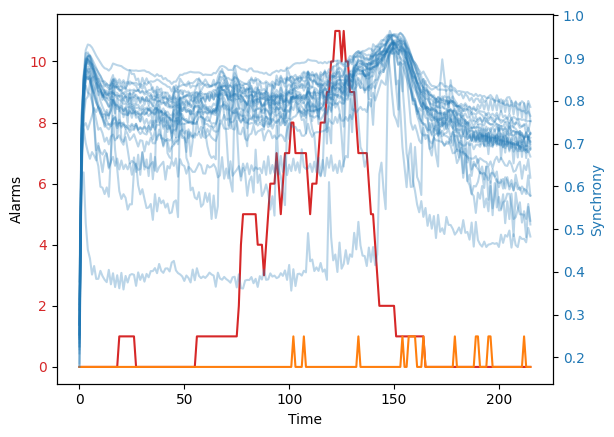

41it [02:59,  4.15s/it]

[ 0.  1.  2.  2.  3. 16. 19. 26. 43. 45. 47. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


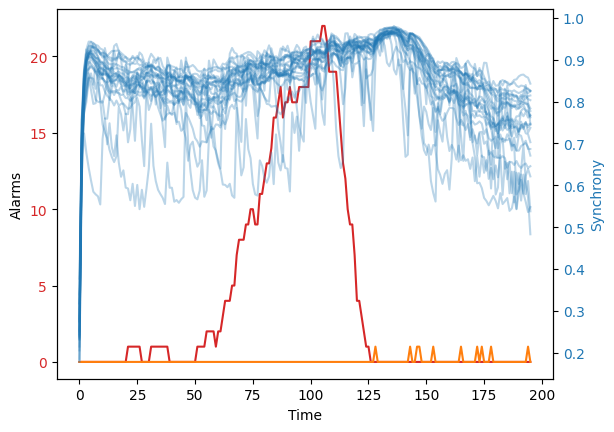

42it [03:03,  4.20s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  5.  6.  8.  9.  9. 11. 12.
 25. 25. 25. 30. nan]
0.00075


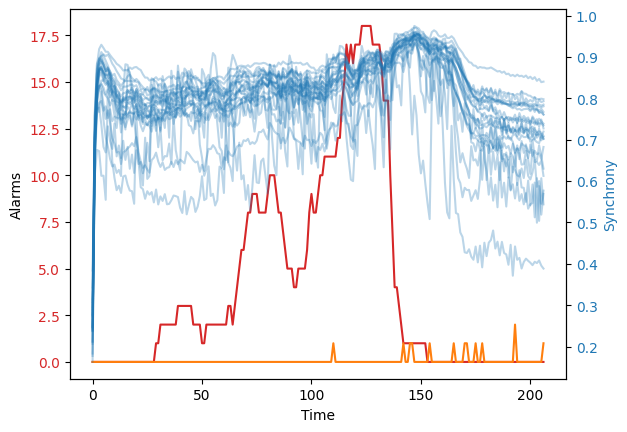

43it [03:08,  4.28s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  6. 31. 37. 39. 39. 40. 41. 41. 48.
 nan nan nan nan nan]
0.00075


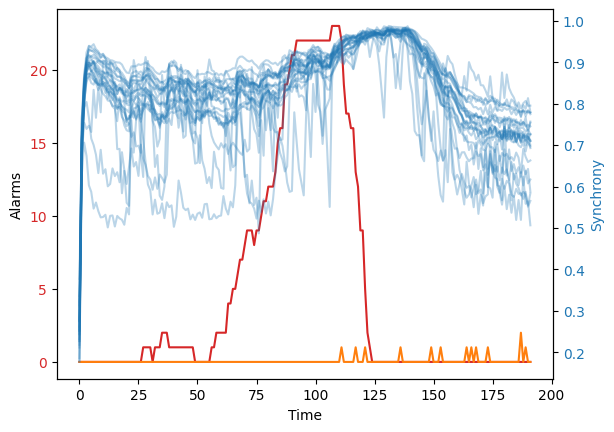

44it [03:12,  4.23s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  3.  5.  8.  9.  9. 10. 12. 12.
 12. 14. 15. 17. 32.]
0.00075


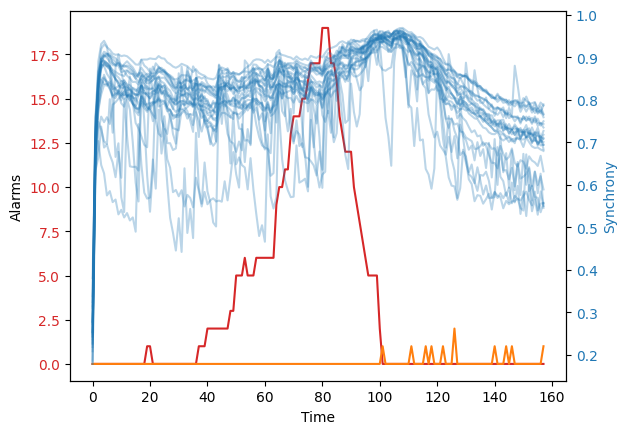

45it [03:15,  3.94s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  5.
  5. nan nan nan nan]
0.00075


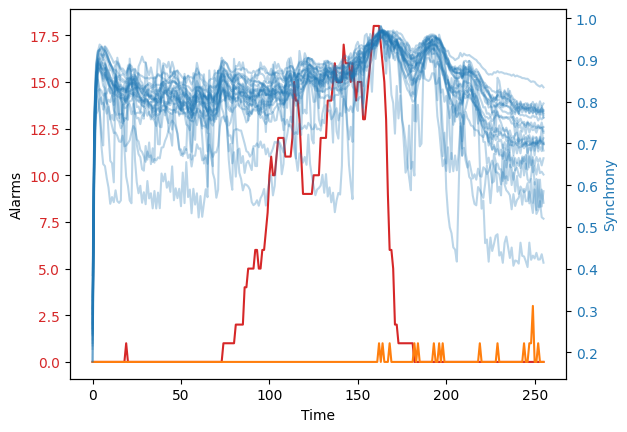

46it [03:21,  4.63s/it]

[ 0.  6. 11. 11. 13. 17. 23. 24. 25. 25. 26. 30. 39. 39. 39. nan nan nan
 nan nan nan nan nan]
0.00075


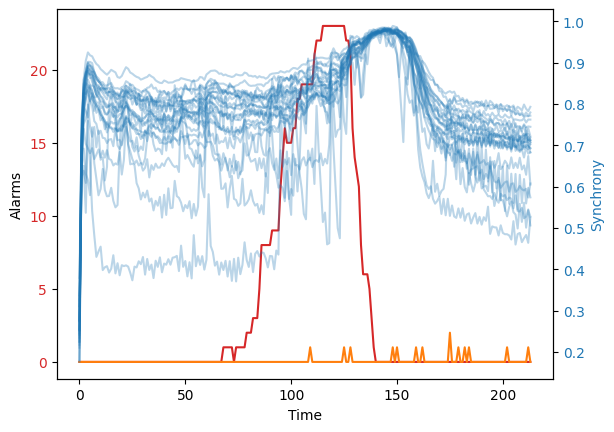

47it [03:27,  4.75s/it]

[ 0.  4.  7. 10. 10. 11. 11. 11. 16. 20. 20. 20. 21. 21. 22. 22. 28. 28.
 30. 36. 36. 37. 40.]
0.00075


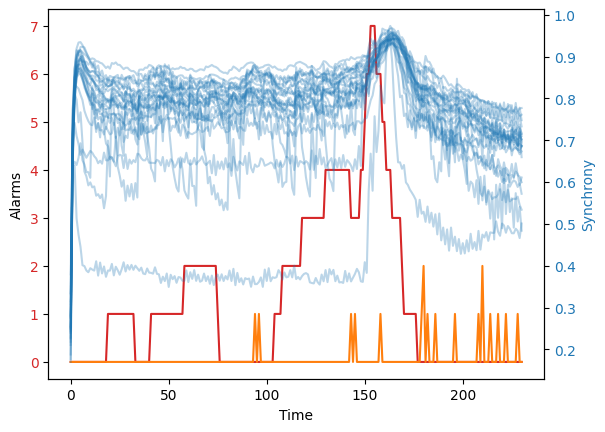

48it [03:32,  5.07s/it]

[ 0. 33. 43. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


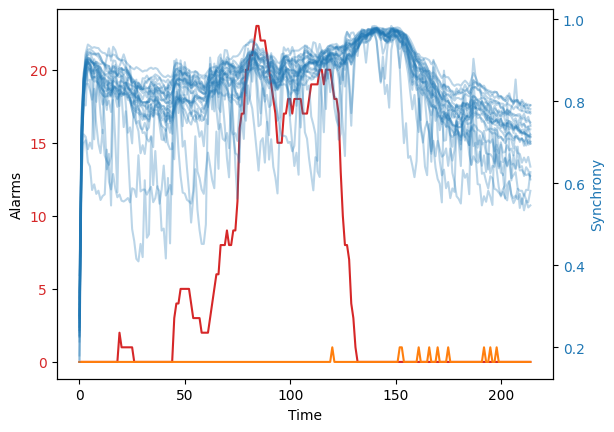

49it [03:38,  5.34s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 2. 4. 4. 4. 6. 8. 9.]
0.00075


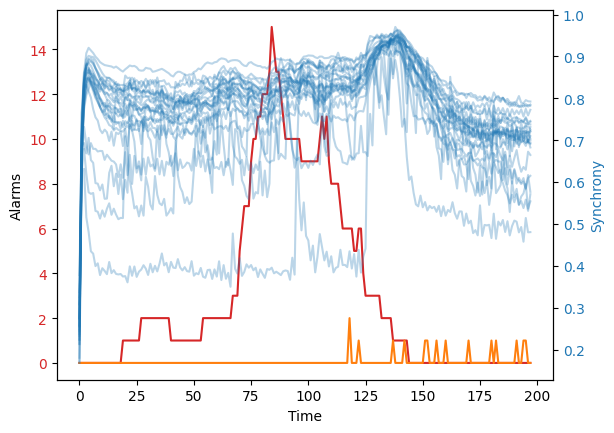

50it [03:42,  4.97s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  3.  5.  8.  9.  9. nan nan nan
 nan nan nan nan nan]
0.00075


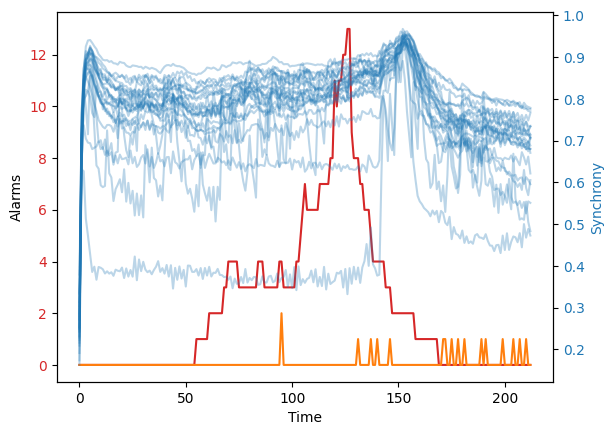

51it [03:47,  4.91s/it]

[ 0.  0.  0.  9. 29. 30. 31. 43. 45. 45. 45. 49. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


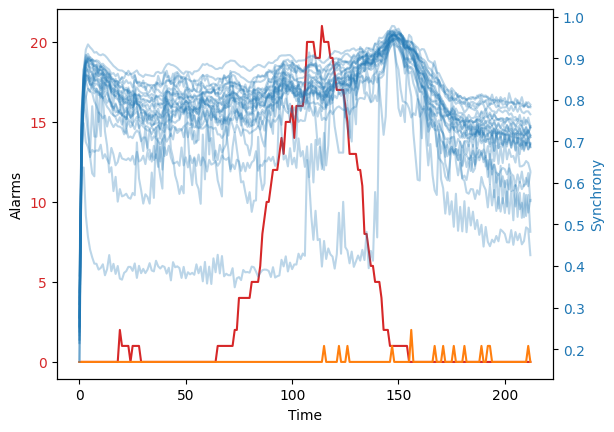

52it [03:52,  4.81s/it]

[ 0.  0.  0.  0.  6. 10. 11. 11. 12. 13. 15. 16. 19. 20. 22. 25. 31. 32.
 32. 32. 39. nan nan]
0.00075


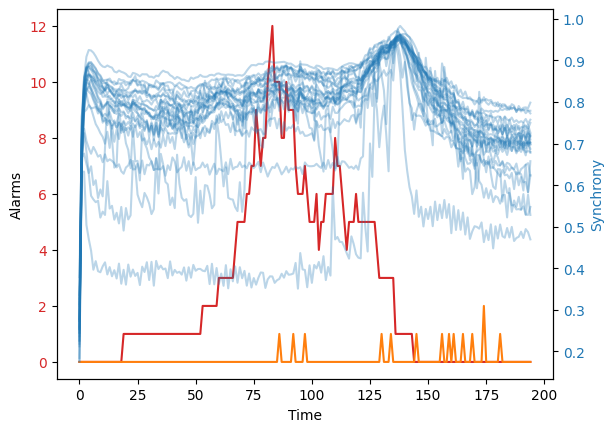

53it [03:56,  4.59s/it]

[ 0.  0.  0.  0.  0.  0.  0.  1.  1.  6.  7.  8. nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


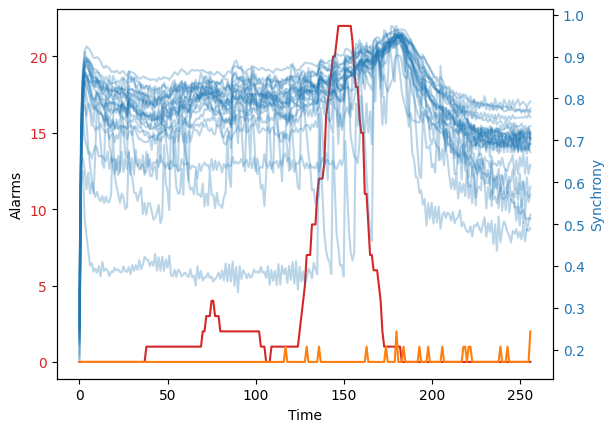

54it [04:02,  5.14s/it]

[ 0.  0.  0.  0. nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


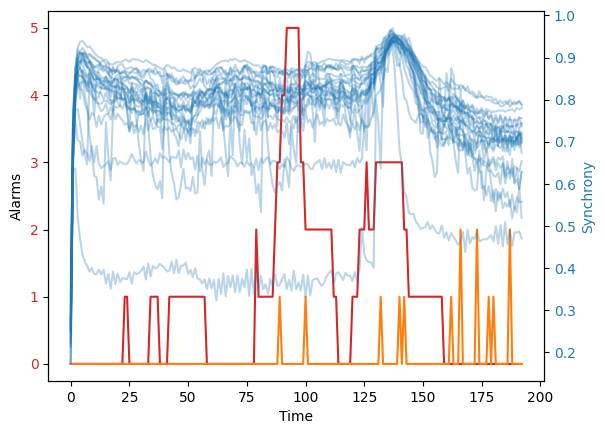

55it [04:07,  4.95s/it]

[ 4.  4. 13. 15. 17. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


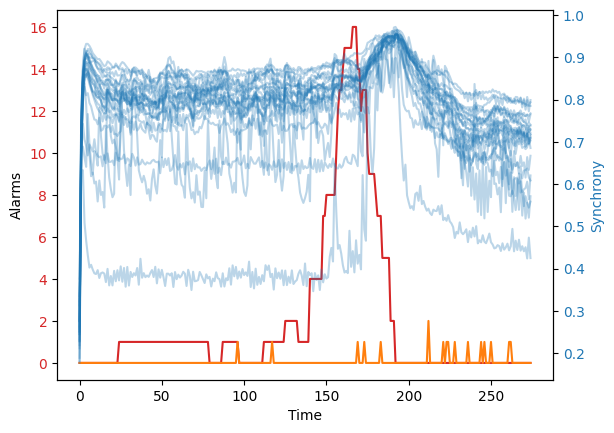

56it [04:13,  5.46s/it]

[ 0. nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


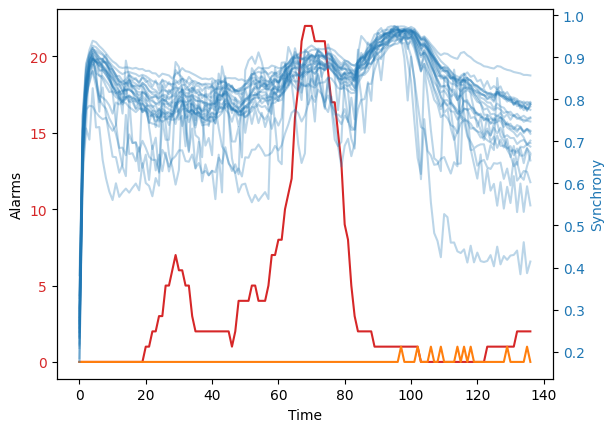

57it [04:16,  4.55s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0. nan nan nan nan]
0.00075


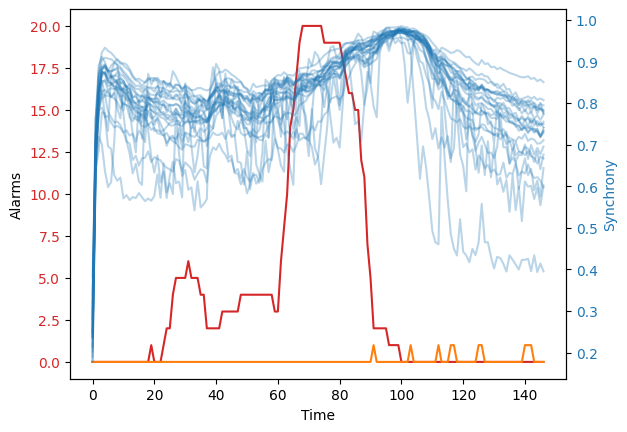

58it [04:19,  4.02s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0. nan nan nan nan]
0.00075


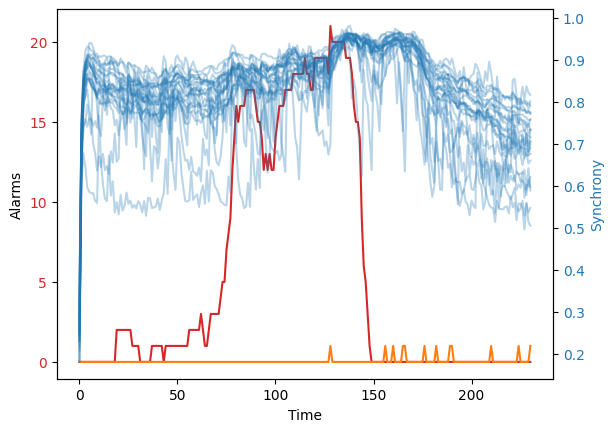

59it [04:24,  4.33s/it]

[ 0.  0.  0.  0.  0.  0.  0.  1.  2.  3.  3.  3.  4.  4.  5.  5. 10. 34.
 40. nan nan nan nan]
0.00075


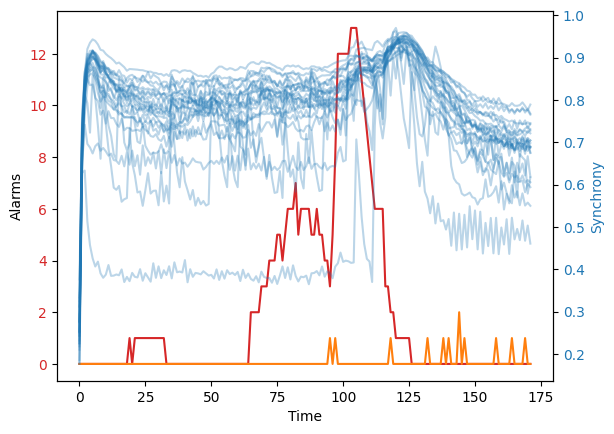

60it [04:27,  4.05s/it]

[ 0.  0.  0.  0.  0.  4.  7. 22. 23. 23. 23. 23. 28. nan nan nan nan nan
 nan nan nan nan nan]
0.00075


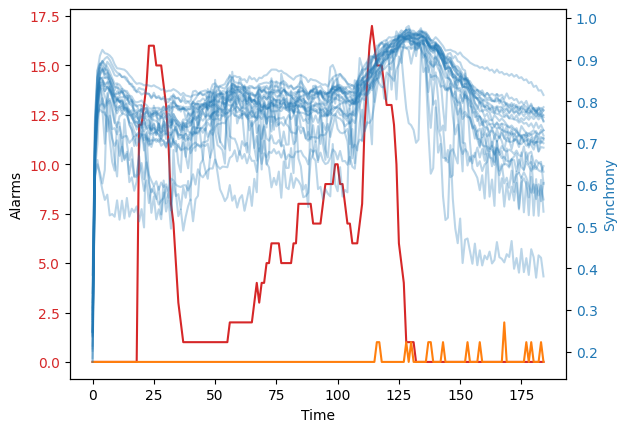

61it [04:31,  4.00s/it]

[ 0.  0.  0.  0.  0.  0.  9.  9. 20. 24. 36. 36. 37. 37. 38. 38. 39. nan
 nan nan nan nan nan]
0.00075


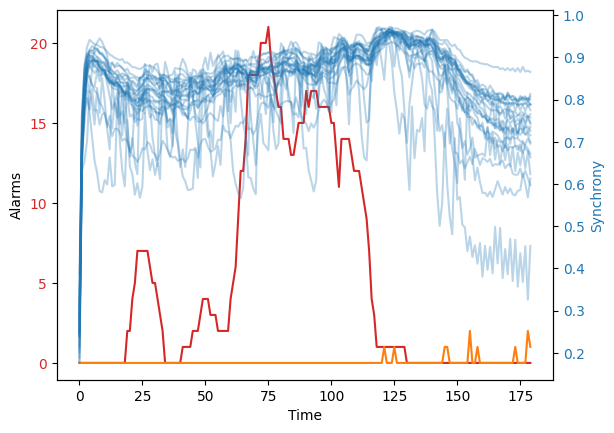

62it [04:35,  3.97s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0. nan nan]
0.00075


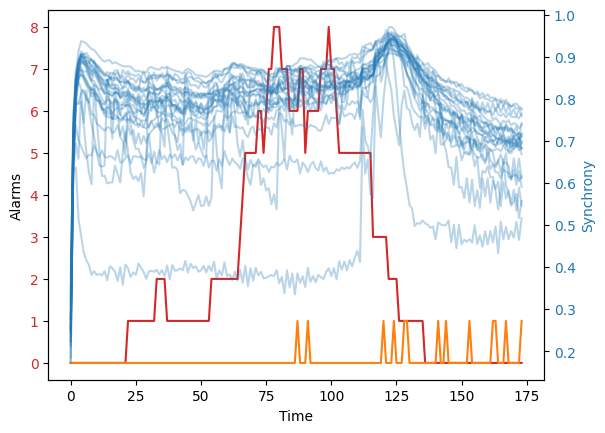

63it [04:38,  3.85s/it]

[ 0.  0.  0.  0.  0.  0.  1.  3. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


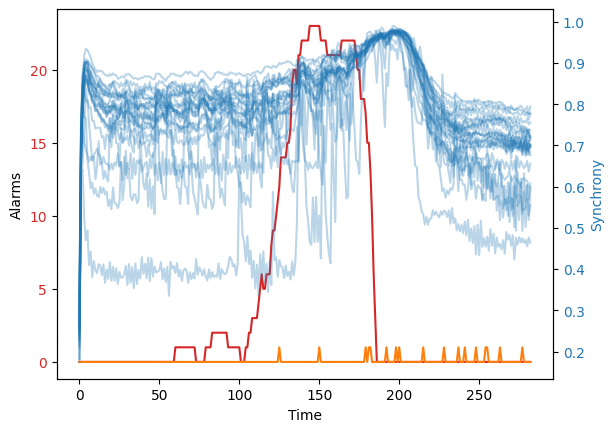

64it [04:45,  4.70s/it]

[ 4.  8. 33. 37. 38. 39. 45. 45. 46. 48. 49. nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


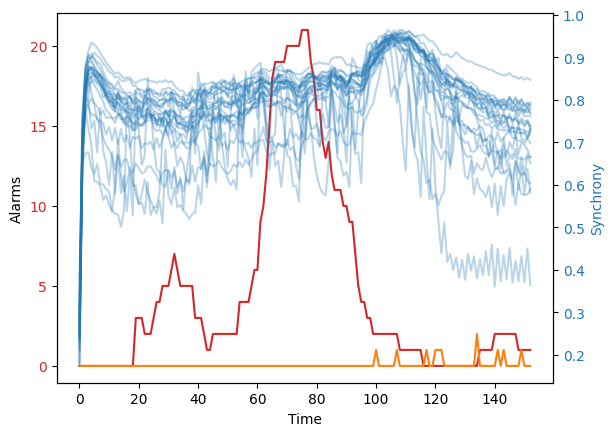

65it [04:48,  4.19s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0. nan nan]
0.00075


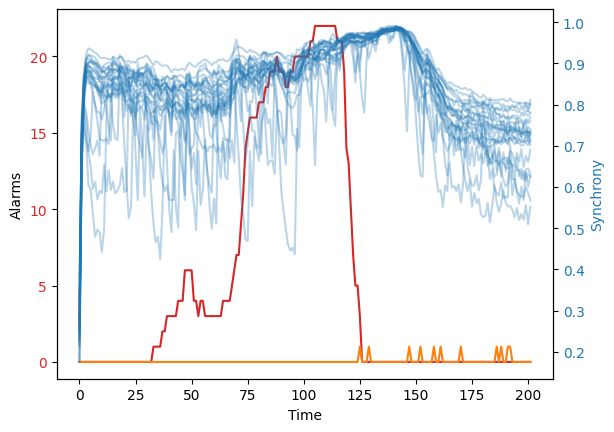

66it [04:53,  4.36s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  5.  8.
 10. 13. 28. 30. nan]


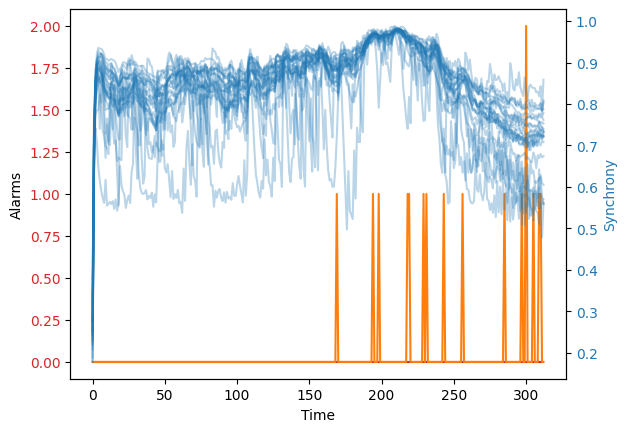

67it [05:01,  5.48s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


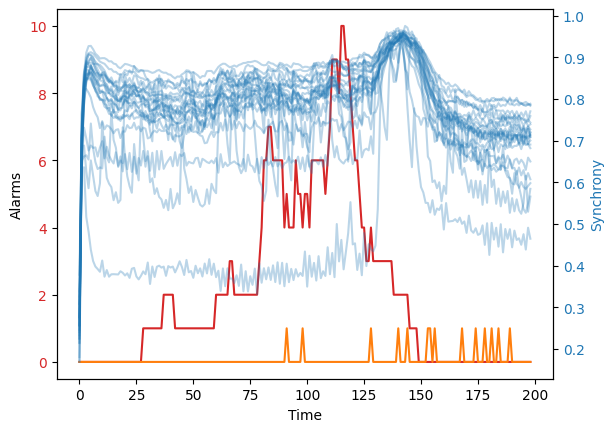

68it [05:06,  5.21s/it]

[ 0.  0.  4.  5.  6.  6.  8. 36. 36. 40. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]


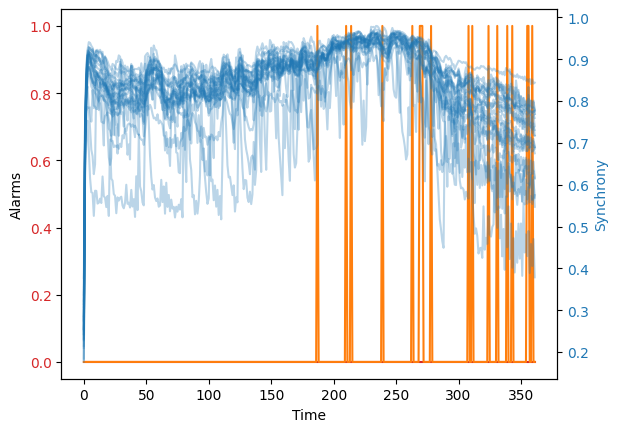

69it [05:15,  6.46s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


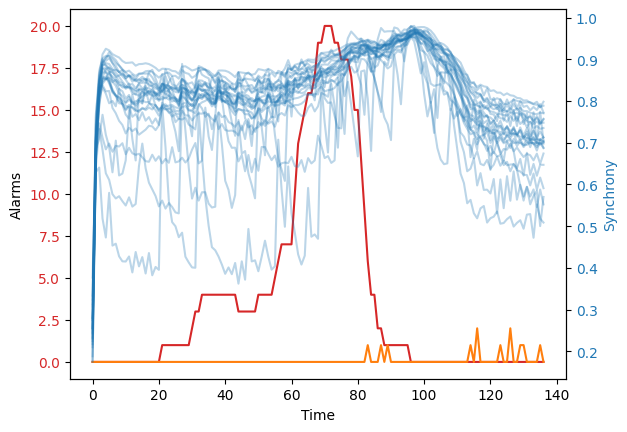

70it [05:17,  5.27s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 nan nan nan nan nan]
0.00075


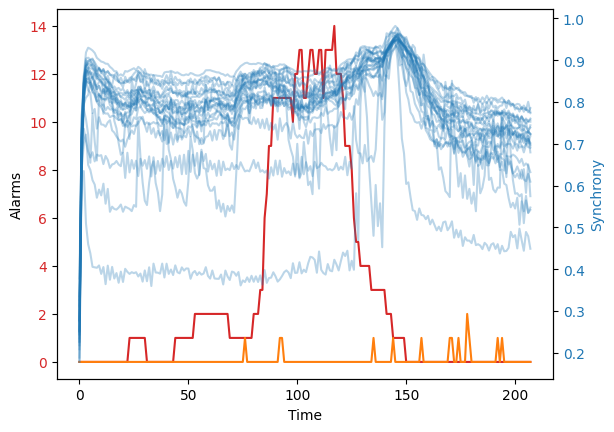

71it [05:22,  5.14s/it]

[ 0.  5.  8. 10. 10. 10. 11. 12. 12. 14. 14. 24. 26. 42. nan nan nan nan
 nan nan nan nan nan]
0.00075


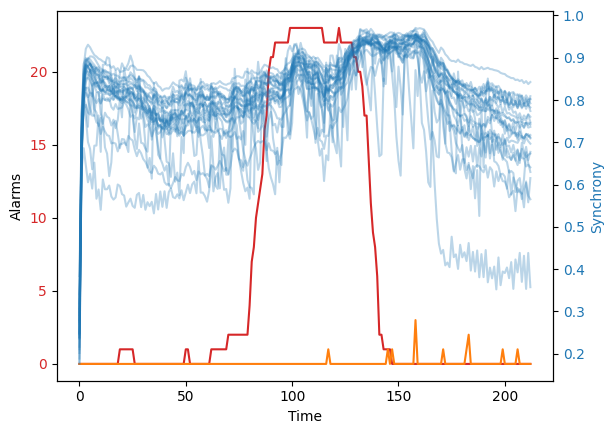

72it [05:27,  5.04s/it]

[ 0.  0.  5.  5.  6.  6.  6.  7.  8.  8.  9. 10. 11. 12. 12. 12. 13. 14.
 14. 14. 15. 17. 24.]
0.00075


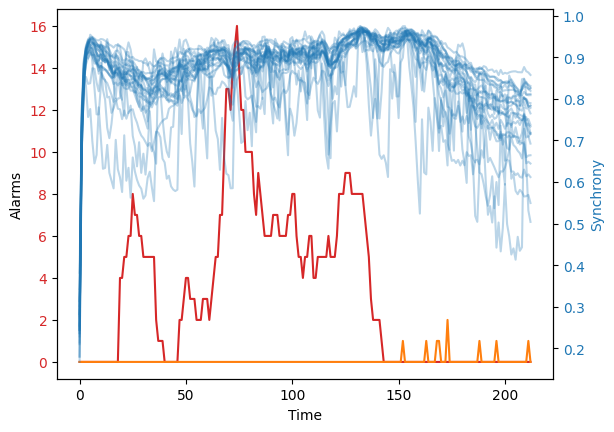

73it [05:32,  4.94s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. nan nan nan nan
 nan nan nan nan nan]
0.00075


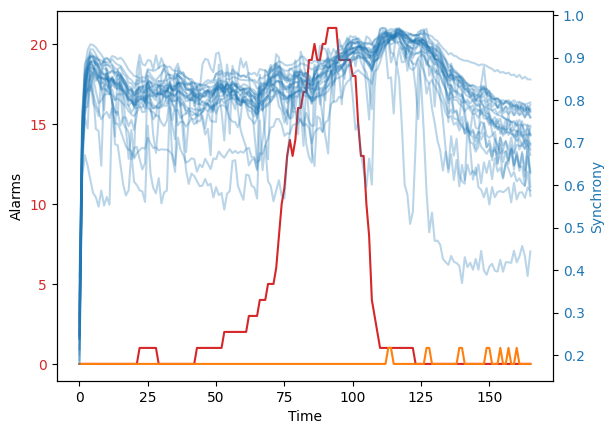

74it [05:35,  4.49s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  2.  5.  5.  7.  9.
  9. 11. 16. nan nan]
0.00075


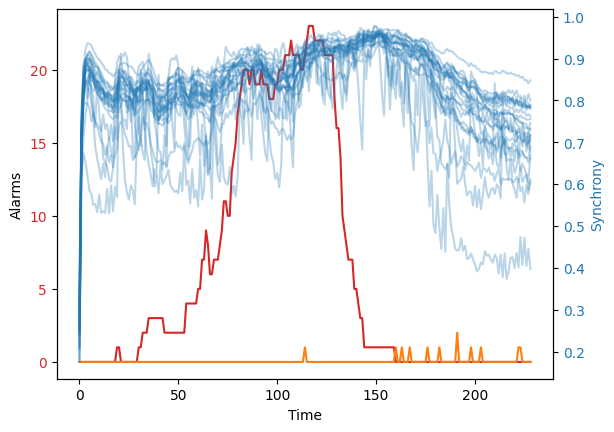

75it [05:40,  4.67s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  2.  2.  3.  4.  5.  5.  6.
  7.  8. 29. 32. 41.]
0.00075


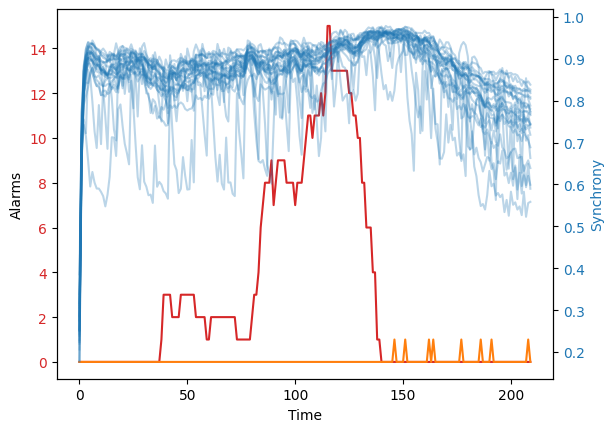

76it [05:45,  4.68s/it]

[ 0.  5.  6.  8.  9.  9. 10. 11. 14. 30. 31. 37. 40. 40. 40. nan nan nan
 nan nan nan nan nan]
0.00075


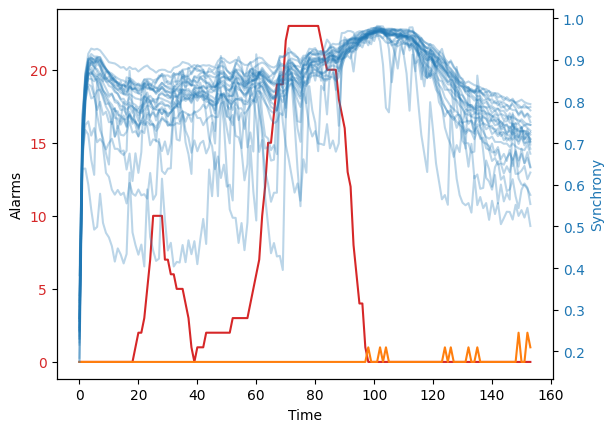

77it [05:48,  4.15s/it]

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
0.00075


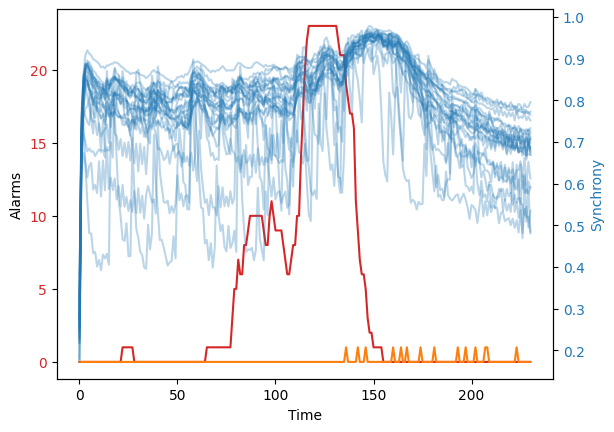

78it [05:53,  4.37s/it]

[ 0.  3.  3.  4.  4.  6.  6.  9. 11. 12. 23. 38. 38. 38. 39. 39. 39. 40.
 40. 40. 41. 41. 42.]
0.00075


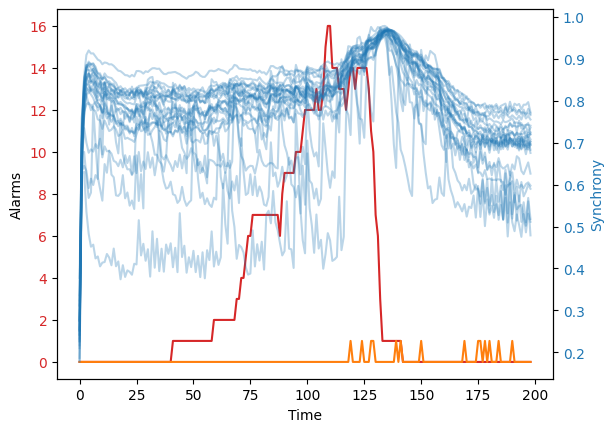

79it [05:57,  4.33s/it]

[ 0.  0.  0.  0.  0.  0.  1. 14. 15. 20. 23. 24. 29. 33. 33. 34. nan nan
 nan nan nan nan nan]
0.00075


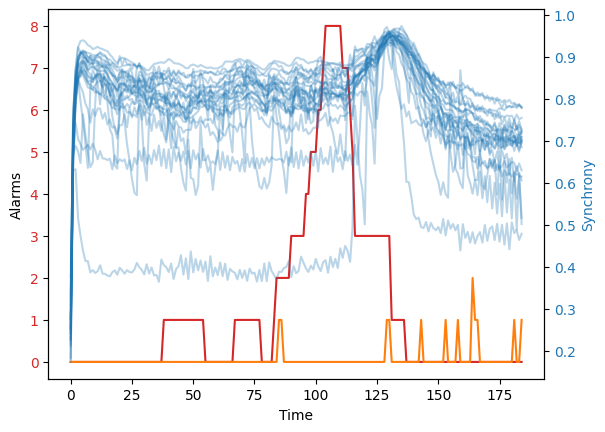

80it [06:01,  4.22s/it]

[ 0.  9. 15. 21. 23. 26. 28. 29. nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


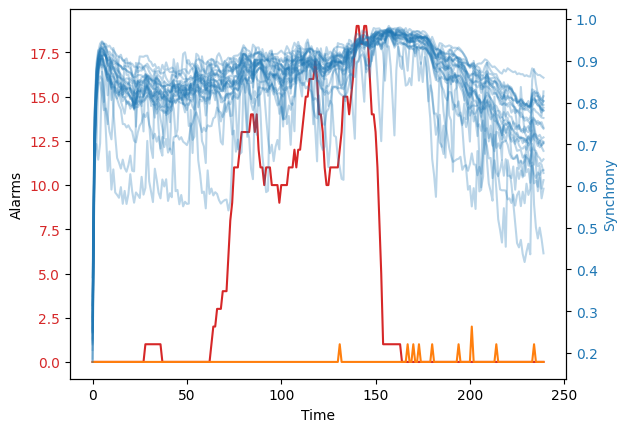

81it [06:07,  4.61s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  4.  9. 38. 40. 43. nan
 nan nan nan nan nan]
0.00075


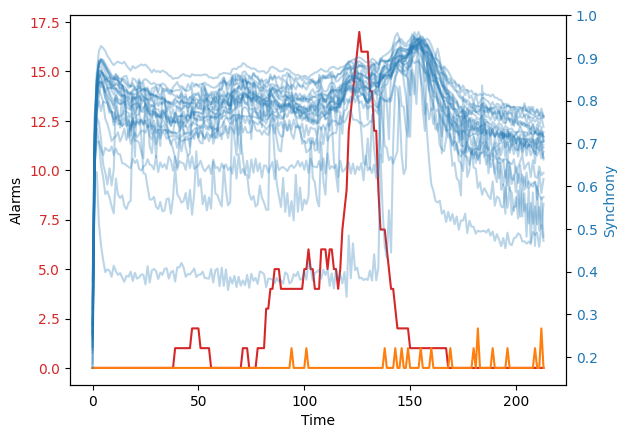

82it [06:11,  4.71s/it]

[ 3.  7.  7.  9. 11. 27. 43. 44. 45. 46. 46. 46. 47. 48. 49. nan nan nan
 nan nan nan nan nan]
0.00075


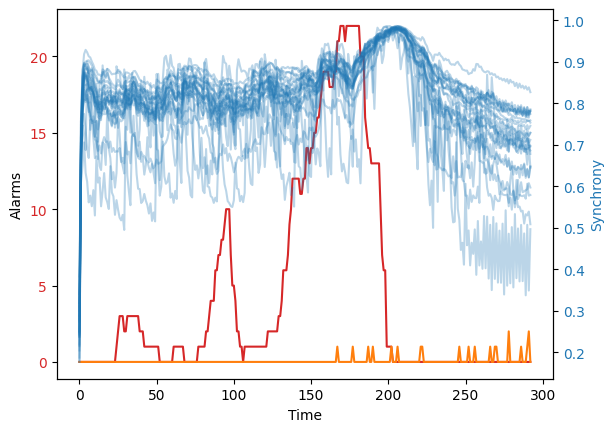

83it [06:18,  5.30s/it]

[ 2.  7.  9. 10. 13. 13. 15. 17. 19. 20. nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


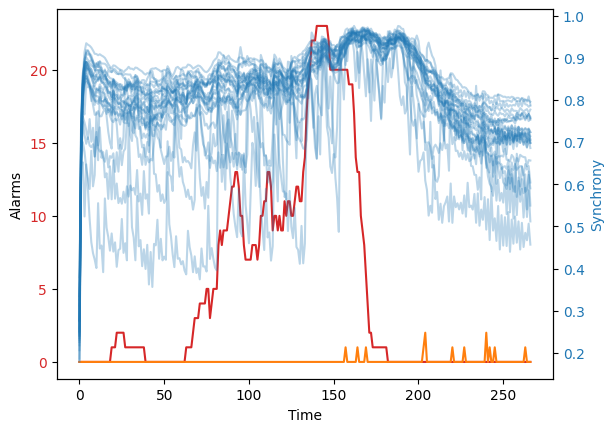

84it [06:24,  5.59s/it]

[ 0.  0.  0.  0.  0.  7.  7.  7.  8. 13. 14. 15. 17. nan nan nan nan nan
 nan nan nan nan nan]
0.00075


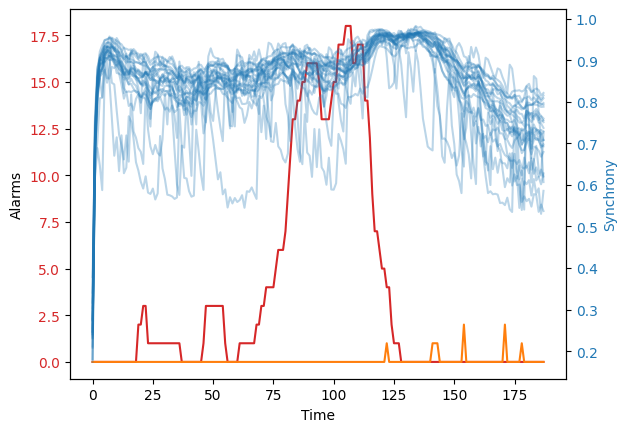

85it [06:29,  5.21s/it]

[ 0.  0.  0.  0.  1.  2.  5.  6.  6.  7.  7.  8.  8. 10. 12. 14. 27. 30.
 nan nan nan nan nan]


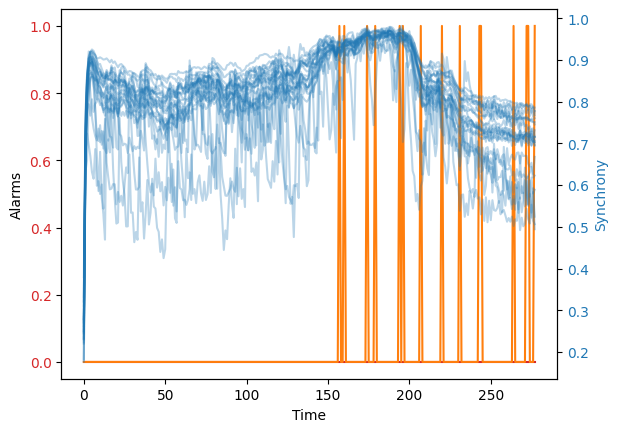

86it [06:36,  5.77s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


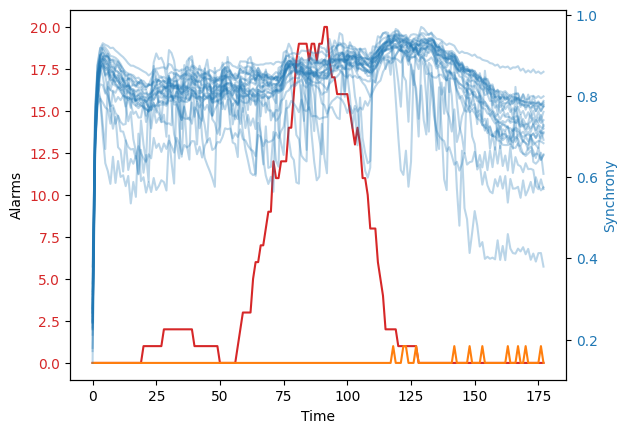

87it [06:40,  5.24s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  2.  2.  4.  4.  5.  5.
  6. 16. nan nan nan]
0.00075


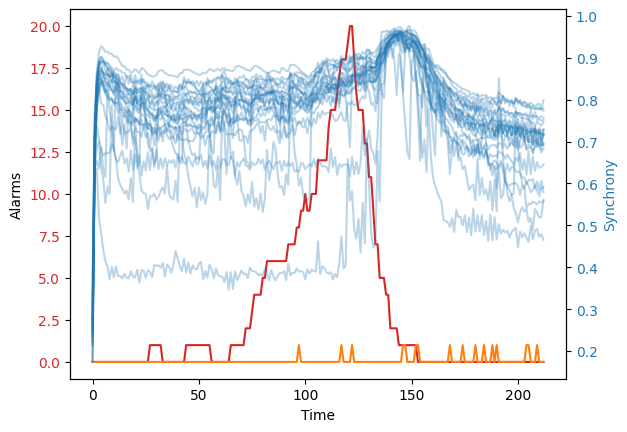

88it [06:45,  5.25s/it]

[ 0.  0.  0.  1.  5.  7. 17. 21. 23. 25. 31. 31. 36. 36. 37. 40. 41. 42.
 45. 46. nan nan nan]
0.00075


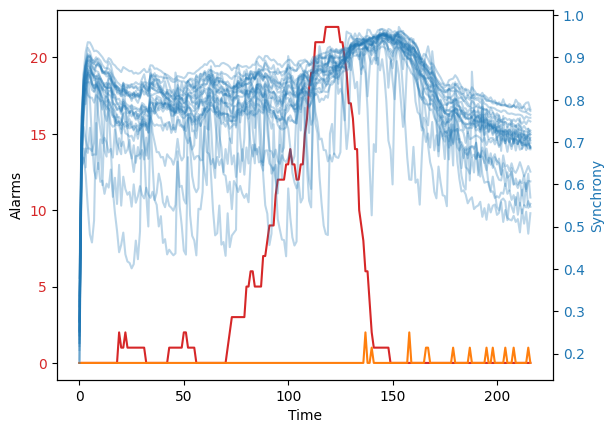

89it [06:50,  5.20s/it]

[ 0.  0.  0.  5.  5.  7. 13. 15. 16. 19. 19. 20. 24. 26. 33. 34. 35. 35.
 36. 38. 38. 43. nan]
0.00075


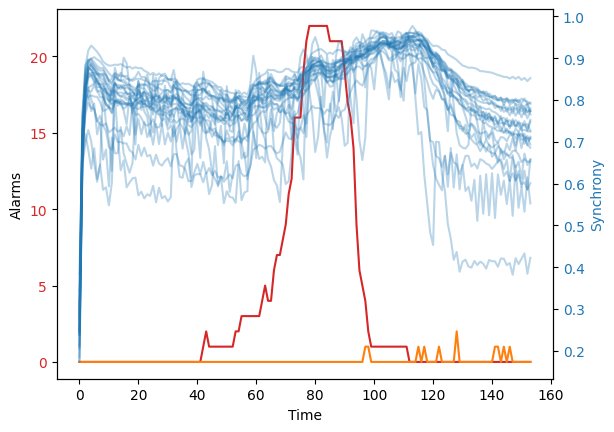

90it [06:53,  4.52s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.
  1.  2.  2.  3. nan]
0.00075


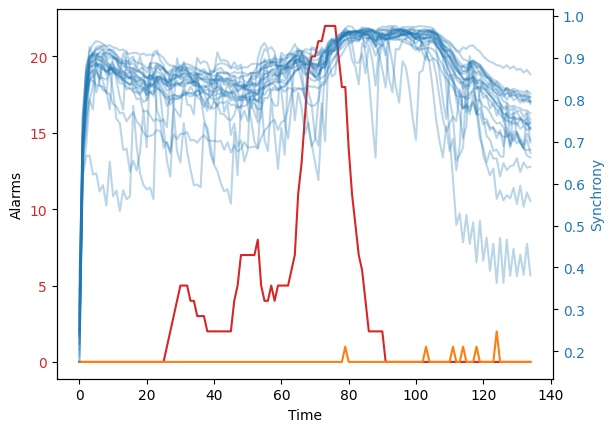

91it [06:55,  3.89s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0. nan]


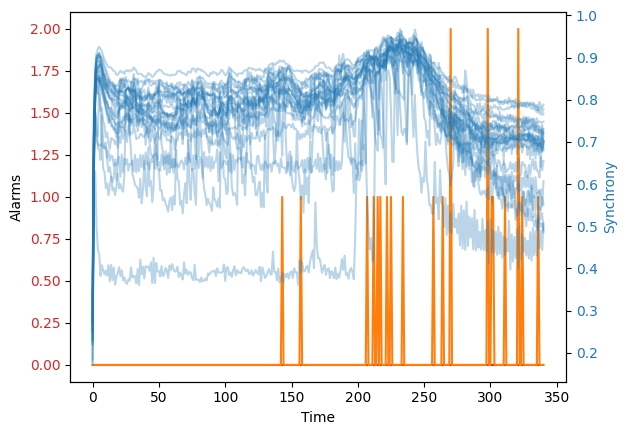

92it [07:04,  5.32s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


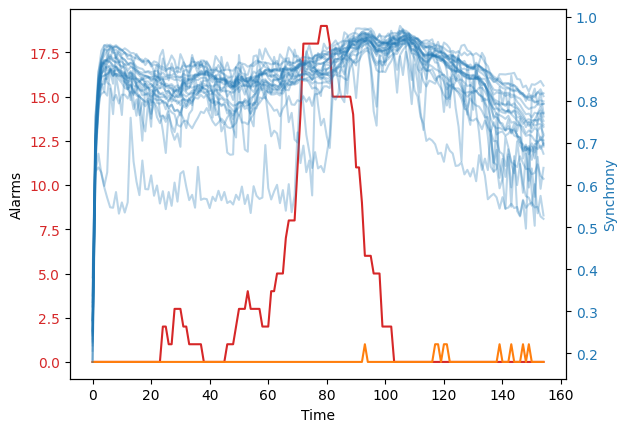

93it [07:07,  4.59s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  3. nan nan nan nan]
0.00075


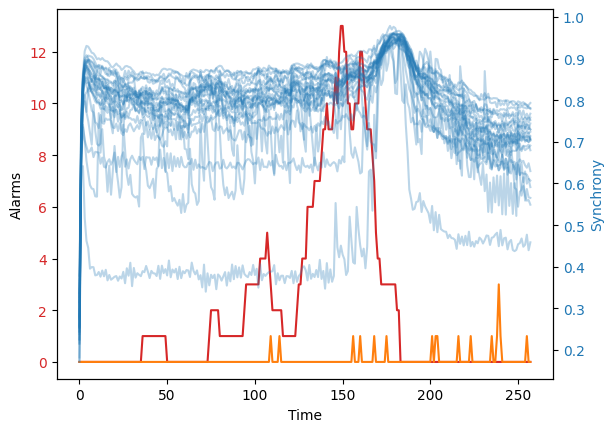

94it [07:13,  5.13s/it]

[ 0.  0. 20. 28. 32. nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


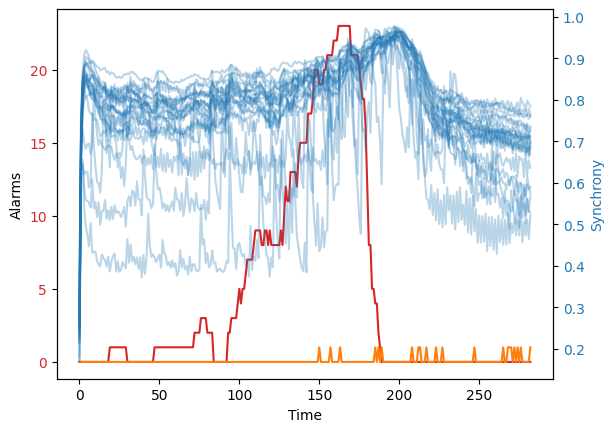

95it [07:20,  5.66s/it]

[ 0.  0.  1. 24. 25. 29. 30. 34. 35. nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]


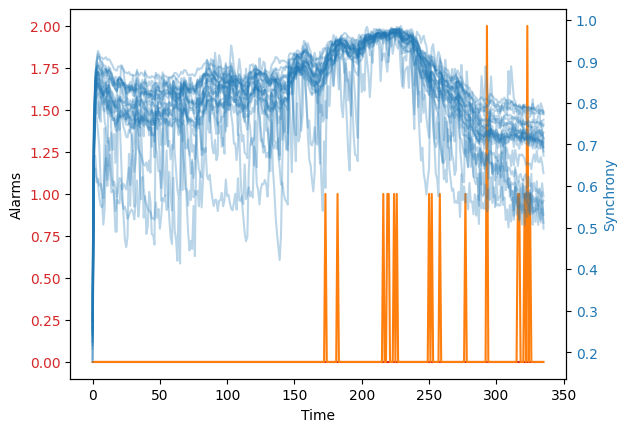

96it [07:29,  6.54s/it]

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


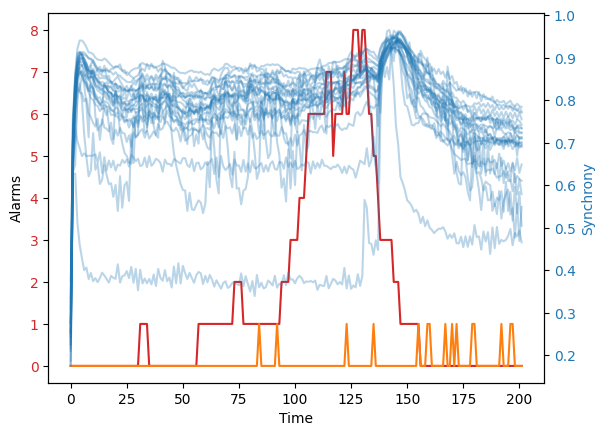

97it [07:34,  6.04s/it]

[ 0.  0. 23. 27. 30. 31. 39. nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]
0.00075


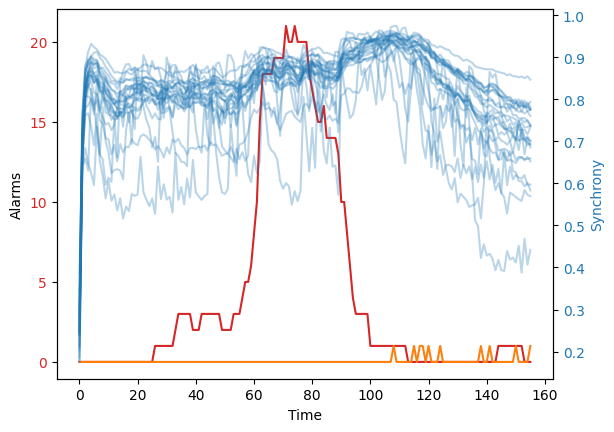

98it [07:37,  5.11s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0. nan nan nan]
0.00075


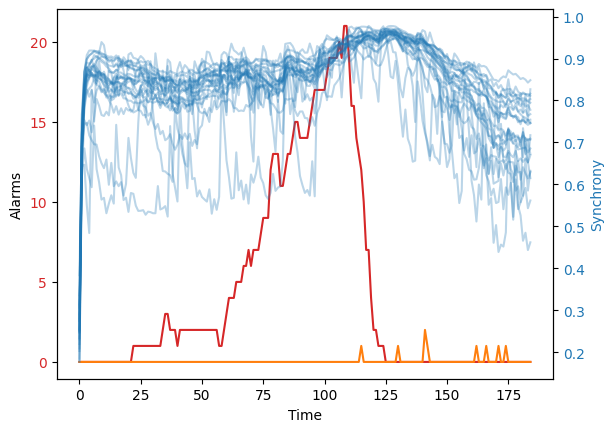

99it [07:41,  4.66s/it]

[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  3.  3.  3.  4. 12. 13. 20. 21. 26.
 27. 31. 33. nan nan]
75
Ours 4 0.8014911463187325 0.7166666666666667 0.9090909090909091 6.7
ADWIN 0 0.8620689655172413 1.0 0.7575757575757576 26.72
DDM 0 0.019801980198019806 0.5 0.010101010101010102 36.0
KSWIN 0 1.0 1.0 1.0 25.717171717171716
PH 0 0.693069306930693 0.5303030303030303 1.0 10.83838383838384
90
Ours 6 0.716639765774558 0.6098901098901099 0.8686868686868687 6.151162790697675
ADWIN 0 0.8929486758230926 0.9186046511627907 0.8686868686868687 18.372093023255815
DDM 0 0.019801980198019806 0.5 0.010101010101010102 21.0
KSWIN 0 1.0 1.0 1.0 10.717171717171718
PH 0 0.6799999999999999 0.5151515151515151 1.0 10.292929292929292
105
Ours 0 0.5993031358885017 0.4574468085106383 0.8686868686868687 0.6976744186046512
ADWIN 0 0.8366896193322073 0.7608695652173914 0.9292929292929293 16.652173913043477
DDM 0 0.019801980198019806 0.5 0.010101010101010102 6.0
KSWIN 0 0.7058823529411764 0.5454545454545454 1.0 4.595959595


C:\Users\ianjw\AppData\Local\Temp\ipykernel_20388\3864017018.py:112: RuntimeWarning: invalid value encountered in divide
  precision = np.nanmean(far_and_first_alarm[:, :, :, :, 2]/(far_and_first_alarm[:, :, :, :, 2] + far_and_first_alarm[:, :, :, :, 0]), axis=2)
C:\Users\ianjw\AppData\Local\Temp\ipykernel_20388\3864017018.py:112: RuntimeWarning: Mean of empty slice
  precision = np.nanmean(far_and_first_alarm[:, :, :, :, 2]/(far_and_first_alarm[:, :, :, :, 2] + far_and_first_alarm[:, :, :, :, 0]), axis=2)
C:\Users\ianjw\AppData\Local\Temp\ipykernel_20388\3864017018.py:115: RuntimeWarning: invalid value encountered in divide
  f1 = (2 * precision * recall)/(precision + recall)


In [6]:
# Run tests (including against other algorithms)

from scipy.stats import theilslopes
from scipy.ndimage import median_filter
from river.drift import ADWIN, binary, KSWIN, PageHinkley

def theil_slopes_detection(data, window_size, min_slope=0.15):
    # Shape must be (channels, t,)
    # First filter
    data = median_filter(data, size=window_size * 4, axes=[-1])
    
    expanded_data = np.zeros(data.shape + (window_size,))
    expanded_data[:, :, 0] = data
    for i in range(1, window_size):
        expanded_data[:, :, i] = np.roll(expanded_data[:, :, i-1], -1, axis=-1)
    
    expanded_data = expanded_data[:, :-window_size + 1]
    stds = np.std(expanded_data, axis=-1)
    
    slopes = theilslopes(expanded_data, axis=-1)
    slopes, ub, lb = slopes.slope, slopes.low_slope, slopes.high_slope

    alarms = np.sum(slopes > min_slope, axis=0)
    # alarms = np.sum(np.logical_or(
    #     np.logical_and(slopes > min_slope, lb > min_slope), np.logical_and(slopes < -min_slope, ub < -min_slope)
    # ), axis=0)
    # alarms = calc_river_alarms(KSWIN, slopes)

    return alarms
    

def calc_river_alarms(alg, data):
    drifts = np.zeros((data.shape[1],))

    for chan in range(data.shape[0]):
        if alg is ADWIN: # Add if statement for mmdagg that adds all the channels, not just one
            a = alg(clock=1)
        else:
            a = alg()

        if alg is MMDAggDriftDetector:
            try:
                for t in range(data.shape[1]):
                    a.update(data[:, t])
                    if a.drift_detected:
                        drifts[t] += 1
            except TypeError:
                pass
        else:
            try:
                for t in range(data.shape[1]):
                    a.update(data[chan, t])
                    if a.drift_detected:
                        drifts[t] += 1
            except ValueError:
                pass
            
    return drifts


far_and_first_alarm = np.zeros((3, 6, len(xs), xs[0].shape[1], 3)) # num ruls, num algo, num trials, num cutoffs, far/first alarm/tpr


for i, (x, rs) in tqdm(enumerate(zip(xs, input_rs))):   
    comp_alarms = []
    for comp in [ADWIN, binary.DDM, KSWIN, PageHinkley]: #, MMDAggDriftDetector]: # 
        comp_alarms.append(calc_river_alarms(comp, x.T))
        
    # Try a couple options
    max_ta_over_fa = 0
    alarms = np.zeros(rs.shape[1])
    for j in [0.00075]: # np.logspace(-4, -2, 10):
        temp_alarms = theil_slopes_detection(rs, 20, min_slope=j)
        if np.sum(temp_alarms[:100]) > 0 and np.sum(temp_alarms[-100:])/np.sum(temp_alarms[:100]) > max_ta_over_fa:
            print(j)
            alarms[-temp_alarms.shape[0]:] = temp_alarms
            max_ta_over_fa = np.sum(temp_alarms[-100:])/np.sum(temp_alarms[:100])
        
    fig, ax1 = plt.subplots()
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Alarms')
    ax1.plot(alarms, color="tab:red")
    for comp in [comp_alarms[0]]:
        ax1.plot(comp, color="tab:orange")
    ax1.tick_params(axis='y', labelcolor="tab:red")
    
    ax2 = ax1.twinx()
    ax2.set_ylabel('Synchrony', color="tab:blue")
    ax2.plot(rs.T, color="tab:blue", alpha=0.3)
    ax2.tick_params(axis='y', labelcolor="tab:blue")
    
    plt.show()

    # Compute stats
    for j, rul in enumerate([75, 90, 105]):
        for k, temp_alarms in enumerate([alarms] + comp_alarms):
            for cutoff in range(xs[0].shape[1]):
                false_alarm_rate = np.sum(temp_alarms[:rul] > cutoff)
                first_true_alarm = np.nonzero(temp_alarms[rul:rul+50] > cutoff)[0]
                if len(first_true_alarm) > 0:
                    far_and_first_alarm[j, k, i, cutoff, 0] = false_alarm_rate > 0
                    far_and_first_alarm[j, k, i, cutoff, 1] = np.min(first_true_alarm)
                    far_and_first_alarm[j, k, i, cutoff, 2] = 1
                else:
                    far_and_first_alarm[j, k, i, cutoff, 0] = false_alarm_rate > 0
                    far_and_first_alarm[j, k, i, cutoff, 1] = np.nan
                    far_and_first_alarm[j, k, i, cutoff, 2] = 0
                    
    print(far_and_first_alarm[0, 0, i, :, 1])

# Find best f1 score for each algorithm for each rul
precision = np.nanmean(far_and_first_alarm[:, :, :, :, 2]/(far_and_first_alarm[:, :, :, :, 2] + far_and_first_alarm[:, :, :, :, 0]), axis=2)
recall = np.nanmean(far_and_first_alarm[:, :, :, :, 2], axis=2)

f1 = (2 * precision * recall)/(precision + recall)

for rul in range(3):
    print([75, 90, 105][rul])
    for algo in range(6):
        try:
            best_cutoff = np.nanargmax(np.round(f1[rul, algo], decimals=2), axis=-1)
            print(
                ["Ours", "ADWIN", "DDM", "KSWIN", "PH", "MMD"][algo], best_cutoff,
                f1[rul, algo, best_cutoff], precision[rul, algo, best_cutoff], recall[rul, algo, best_cutoff],
                np.nanmean(far_and_first_alarm[rul, algo, :, best_cutoff, 1])
            )
        except ValueError:
            pass

for rul in range(2):
    print([70, 85, 100][rul])
    for algo in range(6):
        try:
            best_cutoff = np.nanargmin(np.nanmean(far_and_first_alarm[rul, algo, :, :, 1]), axis=-1)
            print(
                ["Ours", "ADWIN", "DDM", "KSWIN", "PH", "MMD"][algo], best_cutoff,
                f1[rul, algo, best_cutoff], precision[rul, algo, best_cutoff], recall[rul, algo, best_cutoff],
                np.nanmean(far_and_first_alarm[rul, algo, :, best_cutoff, 1])
            )
        except ValueError:
            pass


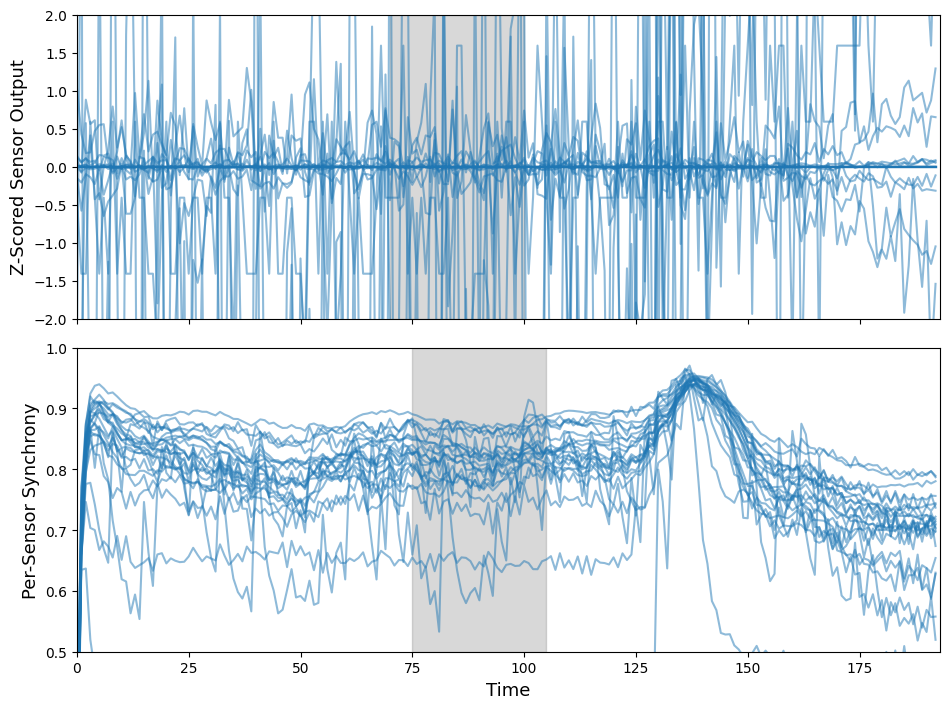

In [7]:
example = 54

SMALL_SIZE = 10
MEDIUM_SIZE = 13
BIGGER_SIZE = 20

plt.rc("font", size=SMALL_SIZE)
plt.rc("axes", titlesize=MEDIUM_SIZE, labelsize=MEDIUM_SIZE)
plt.rc("xtick", labelsize=SMALL_SIZE)
plt.rc("ytick", labelsize=SMALL_SIZE)
plt.rc("legend", fontsize=SMALL_SIZE)
plt.rc("figure", titlesize=BIGGER_SIZE)

fig, axs = plt.subplots(2, 1, sharex=True, figsize=(6.4 * 1.5, 4.8 * 1.5))

axs[0].plot(xs[example], alpha=0.5, color="tab:blue")
axs[0].set_ylabel("Z-Scored Sensor Output")
axs[0].set_ylim([-2, 2])
axs[0].axvspan(70, 100, color="grey", alpha=0.3)
axs[0].set_xlim(0, len(xs[example]))

axs[1].plot(input_rs[example].T, alpha=0.5, color="tab:blue")
axs[1].set_xlabel("Time")
axs[1].set_ylabel("Per-Sensor Synchrony")
axs[1].set_ylim([0.5, 1])
axs[1].axvspan(75, 105, color="grey", alpha=0.3)
axs[1].set_xlim(0, len(xs[example]))

# fig.suptitle("Imperceptible Sensor Faults have Large Effects on Synchrony")

plt.tight_layout()
plt.savefig("nasa-sync-amp.pdf")
plt.show()

In [8]:
# Run significance tests
from lifelines.fitters.coxph_fitter import CoxPHFitter
import pandas as pd


alg_1, thresh_1 = 0, 4
alg_2, thresh_2 = 4, 0

times_1 = np.nan_to_num(far_and_first_alarm[0, alg_1, :, thresh_1, 1], nan=50)
times_2 = np.nan_to_num(far_and_first_alarm[0, alg_2, :, thresh_2, 1], nan=50)

events_1 = ~np.isnan(far_and_first_alarm[0, alg_1, :, thresh_1, 1])
events_2 = ~np.isnan(far_and_first_alarm[0, alg_2, :, thresh_2, 1])

df = pd.DataFrame({
    'time': np.concatenate([times_1, times_2]),
    'event': np.concatenate([events_1, events_2]),
    'group': np.concatenate([np.ones(len(times_1)), np.zeros(len(times_2))])
})

print(np.nanmean(times_1), np.nanmean(times_2))

cph = CoxPHFitter()
cph.fit(df, duration_col='time', event_col='event', formula="group")
cph.print_summary()

10.636363636363637 10.83838383838384


<lifelines.CoxPHFitter: fitted with 198 total observations, 9 right-censored observations>
             duration col = 'time'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 198
number of events observed = 189
   partial log-likelihood = -839.79
         time fit was run = 2025-12-10 20:23:24 UTC

---
           coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                  
group      0.04      1.05      0.15           -0.25            0.34                0.78                1.40

           cmp to    z    p  -log2(p)
covariate                            
group        0.00 0.30 0.77      0.38
---
Concordance = 0.58
Partial AIC = 1681.59
log-likelihood ratio test = 0.09 on 1 df
-log2(p) of ll-ratio test = 0.38

In [16]:
# Run driftbench on data
from drift_helpers import added_detectors 
from drift_helpers import added_metrics

from driftbench.drift_detection.detectors import (
    RandomGuessDetector,
    RollingMeanDifferenceDetector,
    RollingMeanStandardDeviationDetector,
    AggregateFeatureAlgorithm,
    SlidingKSWINDetector,
    ClusterDetector,
    AutoencoderDetector,
    MMDDetector,
)
from driftbench.drift_detection.metrics import (
    TemporalAUC,
    SoftTAUC,
    AUC,
)

from river.drift import ADWIN, KSWIN, PageHinkley

detectors = [
    # Detectors from me
    # added_detectors.RiverDetector(ADWIN, clock=1, delta=0.002),
    # added_detectors.RiverDetector(KSWIN),
    # added_detectors.RiverDetector(PageHinkley),
    # added_detectors.RiverDetectorSingleDetect(MMDAggDriftDetector, window_size=32, step_size=1, alpha=0.001),
    
    # Detectors from driftbench
    MMDDetector(window_size=20, stat_size=20, offset=10),
    MMDDetector(window_size=30, stat_size=30, offset=10),
    MMDDetector(window_size=40, stat_size=40, offset=10),
    MMDDetector(window_size=50, stat_size=50, offset=10),
    RollingMeanDifferenceDetector(window_size=20),
    RollingMeanDifferenceDetector(window_size=30),
    RollingMeanDifferenceDetector(window_size=40),
    RollingMeanDifferenceDetector(window_size=50),
    RollingMeanStandardDeviationDetector(window_size=20),
    RollingMeanStandardDeviationDetector(window_size=30),
    RollingMeanStandardDeviationDetector(window_size=40),
    RollingMeanStandardDeviationDetector(window_size=50),
    ClusterDetector(n_centers=10, method="kmeans"),
    ClusterDetector(n_centers=10, method="gaussian mixture"),
    ClusterDetector(n_centers=5, method="kmeans"),
    ClusterDetector(n_centers=5, method="gaussian mixture"),
    AutoencoderDetector(
        hidden_layers=[80, 50, 20, 10, 2],
        retrain_always=True,
        detector=AggregateFeatureAlgorithm(
            agg_feature_func=np.mean,
            algorithm=SlidingKSWINDetector(window_size=20, stat_size=20, offset=10),
        ),
        num_epochs=50,
        batch_size=200,
        lr=0.001,
    ),
    AutoencoderDetector(
        hidden_layers=[80, 50, 20, 10, 2],
        retrain_always=True,
        detector=AggregateFeatureAlgorithm(
            agg_feature_func=np.mean,
            algorithm=SlidingKSWINDetector(window_size=20, stat_size=20, offset=10),
        ),
        num_epochs=100,
        batch_size=200,
        lr=0.0001,
    ),
    AutoencoderDetector(
        hidden_layers=[80, 20, 4],
        retrain_always=True,
        detector=AggregateFeatureAlgorithm(
            agg_feature_func=np.mean,
            algorithm=SlidingKSWINDetector(window_size=20, stat_size=20, offset=10),
        ),
        num_epochs=10,
        batch_size=200,
        lr=0.0001,
    ),
    AutoencoderDetector(
        hidden_layers=[80, 20, 4],
        retrain_always=True,
        detector=MMDDetector(window_size=20, stat_size=20, offset=10),
        num_epochs=10,
        batch_size=200,
        lr=0.0001,
    ),
    # added_detectors.TheilSlopesDetector(0.0005, 20),
    # added_detectors.TheilSlopesDetector(0.00075, 20),
    # added_detectors.TheilSlopesDetector(0.001, 20),
    # added_detectors.TheilSlopesDetector(0.005, 20),
    # added_detectors.TheilSlopesDetector(0.0005, 30),
    # added_detectors.TheilSlopesDetector(0.00075, 30),
    # added_detectors.TheilSlopesDetector(0.001, 30),
    # added_detectors.TheilSlopesDetector(0.005, 30),
]

f1_score = added_metrics.F1_Score()
metrics = [
    f1_score,
    added_metrics.Precision(f1_metric_obj=f1_score),
    added_metrics.Recall(f1_metric_obj=f1_score),
    added_metrics.Delay(f1_metric_obj=f1_score),
    added_metrics.EarlyDetect(f1_metric_obj=f1_score),
    added_metrics.Accuracy(f1_metric_obj=f1_score),
    TemporalAUC(rule='step'),
    TemporalAUC(rule='trapez'),
    SoftTAUC(rule='step'),
    AUC(),
]

output = []

for detector in tqdm(detectors):
    all_pred_train = []
    all_r_pred_train = []
    all_y_train = []

    all_pred_test = []
    all_r_pred_test = []
    all_y_test = []

    for i in range(len(input_rs)):
        Y = np.zeros((xs[i].shape[0],))
        Y[xs[i].shape[0]//10 * 6:] = 1
        # Y[75:] = 1

        prediction = detector.predict(xs[i])
        r_prediction = detector.predict(input_rs[i].T - np.mean(input_rs[i].T, 0, keepdims=True))

        if i > len(input_rs) * 0.8:
            all_y_train.append(Y)
            all_pred_train.append(prediction)
            all_r_pred_train.append(r_prediction)
        else:
            all_y_test.append(Y)
            all_pred_test.append(prediction)
            all_r_pred_test.append(r_prediction)

    all_pred_train = np.concatenate(all_pred_train, axis=0)
    all_r_pred_train = np.concatenate(all_r_pred_train, axis=0)
    all_y_train = np.concatenate(all_y_train, axis=0)

    all_pred_test = np.concatenate(all_pred_test, axis=0)
    all_r_pred_test = np.concatenate(all_r_pred_test, axis=0)
    all_y_test = np.concatenate(all_y_test, axis=0)

    try:
        f1_score(all_pred_train, all_y_train)
        pred_thresh = f1_score.thresh
        f1_score(all_r_pred_train, all_y_train)
        pred_r_thresh = f1_score.thresh
        
        try:
            output.append({
                "sample": i,
                "detector": detector.name,
                "params": detector.get_hparams(),
                "generic_metrics": {
                    metric.name: metric(all_pred_test, all_y_test, set_threshold=pred_thresh) for metric in metrics
                },
                "r_metrics": {
                    metric.name: metric(all_r_pred_test, all_y_test, set_threshold=pred_r_thresh) for metric in metrics
                }
            })
        except TypeError:
            output.append({
                "sample": i,
                "detector": detector.name,
                "params": detector.get_hparams(),
                "generic_metrics": {
                    metric.name: metric(all_pred_test, all_y_test) for metric in metrics
                },
                "r_metrics": {
                    metric.name: metric(all_r_pred_test, all_y_test) for metric in metrics
                }
            })
    except ValueError:
        pass
    print(detector.name, f1_score.chosen, output[-1]["generic_metrics"]["F1_Score"], output[-1]["r_metrics"]["F1_Score"])

  5%|███▉                                                                          | 1/20 [57:09<18:05:59, 3429.46s/it]

MMDDetector 239 0.6820228384991843 0.7014720314033365


 10%|███████▌                                                                    | 2/20 [1:38:29<14:21:22, 2871.26s/it]

MMDDetector 148 0.6784170642716812 0.7218950064020486


 15%|███████████▍                                                                | 3/20 [2:09:15<11:20:52, 2403.08s/it]

MMDDetector 97 0.6699939867708959 0.7031707317073171


 20%|███████████████▍                                                             | 4/20 [2:33:31<9:01:02, 2028.92s/it]

MMDDetector 67 0.5852546681862014 0.6746932952924394


 25%|███████████████████▎                                                         | 5/20 [2:33:31<5:24:22, 1297.47s/it]

RollingMeanDifferenceDetector 67 0.5852546681862014 0.6746932952924394


 30%|███████████████████████▍                                                      | 6/20 [2:33:32<3:19:50, 856.47s/it]

RollingMeanDifferenceDetector 67 0.5852546681862014 0.6746932952924394


 35%|███████████████████████████▎                                                  | 7/20 [2:33:32<2:04:55, 576.61s/it]

RollingMeanDifferenceDetector 67 0.5852546681862014 0.6746932952924394


 40%|███████████████████████████████▏                                              | 8/20 [2:33:33<1:18:38, 393.18s/it]

RollingMeanDifferenceDetector 67 0.5852546681862014 0.6746932952924394


 45%|████████████████████████████████████                                            | 9/20 [2:33:33<49:34, 270.40s/it]

RollingMeanStandardDeviationDetector 67 0.5852546681862014 0.6746932952924394


 50%|███████████████████████████████████████▌                                       | 10/20 [2:33:33<31:10, 187.06s/it]

RollingMeanStandardDeviationDetector 67 0.5852546681862014 0.6746932952924394


 55%|███████████████████████████████████████████▍                                   | 11/20 [2:33:34<19:29, 129.94s/it]

RollingMeanStandardDeviationDetector 67 0.5852546681862014 0.6746932952924394


 60%|████████████████████████████████████████████████                                | 12/20 [2:33:34<12:04, 90.54s/it]

RollingMeanStandardDeviationDetector 67 0.5852546681862014 0.6746932952924394


 65%|████████████████████████████████████████████████▊                          | 13/20 [7:42:54<11:03:18, 5685.47s/it]

ClusterDetector 1 0.5853059793091355 0.587241531016278


 70%|█████████████████████████████████████████████████████▏                      | 14/20 [7:43:01<6:37:02, 3970.47s/it]

ClusterDetector 1 0.5853059793091355 0.587241531016278


 75%|███████████████████████████████████████████████████████▌                  | 15/20 [12:46:35<11:28:38, 8263.62s/it]

ClusterDetector 1 0.5852546681862014 0.5860989907003393


 80%|████████████████████████████████████████████████████████████               | 16/20 [12:46:41<6:25:13, 5778.32s/it]

ClusterDetector 1 0.5852546681862014 0.5860989907003393


 85%|███████████████████████████████████████████████████████████████▊           | 17/20 [12:48:17<3:23:28, 4069.52s/it]

AutoencoderDetector 4 0.7057058789592109 0.6235300055519103


 90%|███████████████████████████████████████████████████████████████████▌       | 18/20 [12:50:56<1:36:29, 2894.60s/it]

AutoencoderDetector 4 0.6804163207968841 0.6133843587479149


 95%|█████████████████████████████████████████████████████████████████████████▏   | 19/20 [12:51:31<33:55, 2035.66s/it]

AutoencoderDetector 4 0.5852737017836745 0.6092143808255659


100%|█████████████████████████████████████████████████████████████████████████████| 20/20 [13:54:17<00:00, 2502.86s/it]

AutoencoderDetector 14 0.64882400648824 0.6582309432116878


In [17]:
output

[{'sample': 98,
  'detector': 'MMDDetector',
  'params': {},
  'generic_metrics': {'F1_Score': np.float64(0.6820228384991843),
   'Precision': np.float64(0.6042317030870621),
   'Recall': np.float64(0.7828040742959856),
   'Delay': np.float64(4.2125),
   'EarlyDetect': np.float64(8.6875),
   'Accuracy': np.float64(0.820299913248234),
   'TAUC-step': np.float64(0.015371927344530705),
   'TAUC-trapez': 0.015228482974958428,
   'SoftTAUC': np.float64(-0.1457902523084249),
   'AUC': 0.7698220113907746},
  'r_metrics': {'F1_Score': np.float64(0.7014720314033365),
   'Precision': np.float64(0.6227204088744337),
   'Recall': np.float64(0.8030257639304973),
   'Delay': np.float64(3.75),
   'EarlyDetect': np.float64(10.826086956521738),
   'Accuracy': np.float64(0.837030610980295),
   'TAUC-step': np.float64(0.061093135768871626),
   'TAUC-trapez': 0.06075951754619128,
   'SoftTAUC': np.float64(-0.0066844694977574795),
   'AUC': 0.8252333543438678}},
 {'sample': 98,
  'detector': 'MMDDetector',

In [ ]:
# Separate f1 scores by detector and whether using RS
separated_output = {}
for result in output:
    params = ",".join("%s:%s" % (k, v) for k, v in result["params"].items())
    separated_output[result["detector"] + "," + params] = separated_output.get(result["detector"] + "," + params, {
        "generic": [],
        "rs": []
    })

    separated_output[result["detector"] + "," + params]["generic"].append(result["generic_metrics"])
    separated_output[result["detector"] + "," + params]["rs"].append(result["r_metrics"])

print(separated_output[result["detector"] + "," + params]["rs"][0].keys())
for k, v in separated_output.items():
    separated_output[k]["metrics"] = {
        "generic" : {
            k: np.nanmean([i[k] for i in v["generic"]]) for k in v["generic"][0].keys()
        },
        "rs" : {
            k: np.nanmean([i[k] for i in v["rs"]]) for k in v["rs"][0].keys()
        }
    }
    print(k)
    print(separated_output[k]["metrics"])
    print("====================================")

In [ ]:
plt.plot(xs[i])
plt.plot(detectors[0].predict(xs[i]))
# plt.plot(input_rs[i].T - np.mean(input_rs[i].T, 0, keepdims=True))

In [ ]:
# Run significance tests
from lifelines.fitters.coxph_fitter import CoxPHFitter
import pandas as pd
import json

for detector, stats in separated_output.items():
    times_1 = np.asarray([stat["Delay"] for stat in stats["generic"]])
    times_2 = np.asarray([stat["Delay"] for stat in stats["rs"]])

    events_1 = ~np.isnan(times_1)
    events_2 = ~np.isnan(times_2)
    
    df = pd.DataFrame({
        'time': np.concatenate([times_1, times_2]),
        'event': np.concatenate([events_1, events_2]),
        'group': np.concatenate([np.ones(len(times_1)), np.zeros(len(times_2))])
    })
        
    cph = CoxPHFitter()
    cph.fit(df, duration_col='time', event_col='event', formula="group")
    separated_output[detector]["hr"] = float(cph.summary["exp(coef)"])
    separated_output[detector]["p"] = float(cph.summary["p"])

with open("cmapss_results.json", "w") as f:
    json.dump(separated_output, f)